# Fit the QPO in 1ES 1927+654 with a Lorentzian on top of the broadband noise model to determine QPO characteristics like Q and RMS

In [7]:
# load packages
import numpy as np 
import matplotlib.pyplot as plt
import scipy.optimize as opt
import scipy.integrate as integ
import scipy.fft
import os
import astropy.stats as st
from astropy import units as u
from astropy import constants as const
from astropy.io import fits
from astropy.time import Time
from astropy.table import Table
from astropy.coordinates import SkyCoord
import pandas as pd
from matplotlib.ticker import ScalarFormatter, FormatStrFormatter, NullFormatter
from matplotlib import ticker
from matplotlib.colors import Normalize
import json
import glob
# from redshift get d_L
from astropy.cosmology import FlatLambdaCDM
cosmo = FlatLambdaCDM(H0=70 * u.km / u.s / u.Mpc, Om0=0.3)
# emcee stuff
import multiprocessing as mp
# from multiprocessing import Pool
import emcee
import corner
import pylag
from joblib import Parallel, delayed
from scipy.stats import binned_statistic

from timing import *

# set up plotting defaults
plt.rc('font', family='sans')
params = {
   'axes.labelsize': 45,
   'axes.linewidth': 3,
   'legend.fontsize': 30,
   'legend.frameon': True,
   'legend.fancybox': False,
   'legend.framealpha': 0.8,
   'legend.edgecolor': 'k',
   'lines.linewidth': 2,
   'font.size': 40,
   'font.weight': 'normal',
   'xtick.direction': 'in',
   'xtick.labelsize': 35,
   'xtick.color':'k',
   'xtick.major.bottom': True,
   'xtick.major.pad': 10,
   'xtick.major.size': 18,
   'xtick.major.width': 2,
   'xtick.minor.bottom': True,
   'xtick.minor.pad': 10,
   'xtick.minor.size': 9,
   'xtick.minor.top': True,
   'xtick.minor.visible': True,
   'xtick.minor.width': 2,
   'xtick.top': True,
   'ytick.direction': 'in',
   'ytick.labelsize': 35,
   'ytick.left': True,
   'ytick.right': True,
   'ytick.major.pad': 10,
   'ytick.major.size': 18,
   'ytick.major.width': 2,
   'ytick.minor.pad': 3.5,
   'ytick.minor.size': 9,
   'ytick.minor.visible': True,
   'ytick.minor.width': 2,
   'text.usetex': False,
   'figure.figsize': [10,10],
   'savefig.dpi': 500,
   }
plt.rcParams.update(params)

fig_path = '../figures/'
data_path = '../data/lightcurves/'
mcmc_path_bb = 'broadband_mcmcs/'
mcmc_path_qpo = 'qpo_mcmcs/'

## Set up the MCMC with priors, likelihoods, etc for various different broadband models (+ with and without the QPO)

In [2]:
# first we need to fit the continuum model -- then we will use this to generate simulated light curves
def log_likelihood(theta, f, y, model):
    if model == 'powerlaw':
        N0, b, c = theta
        model_y = powerlaw(f, N0, b, c)
    elif model == 'lorentzian':
        R, delta, c = theta
        model_y = lorentzian(f, R, delta, c)
    elif model == 'qpo_pl':
        N0, b, c, v0, R, delta = theta
        model_y = qpo_pl(f, N0, b, c, v0, R, delta)
    elif model == 'qpo_lor':
        R_bb, delta_bb, c, v0, R, delta = theta
        model_y = qpo_pl(f, R_bb, delta_bb, c, v0, R, delta)
    return 2 * np.sum((y / model_y) + np.log(model_y))

def log_prior(theta, model):
    if model == 'powerlaw':
        N0, b, c = theta
        if 0 < N0 < 1e10 and -5 < b < 5 and 0 < c < 100:
            return 0.0
    elif model == 'lorentzian':
        R, delta, c = theta
        if 0 < R < 1e2 and 1e-10 < delta < 1e1 and 1e-10 < c < 100:
            return 0.0
    elif model == 'qpo_pl':
        N0, b, c, v0, R, delta = theta
        if 0 < N0 < 1e4 and 0 < b < 5 and 0 < c < 100 and 0 < R < 10 and 0 < delta < 3e-4 and 0 < v0 < 0.01:
            return 0.0
    elif model == 'qpo_lor':
        R_bb, delta_bb, c, v0, R, delta = theta
        if 1e-3 < R_bb < 1e2 and 1e-4 < delta_bb < 1e1 and 1e-10 < c < 100 and 1e-3 < R < 1e2 and 1e-7 < delta < 1e-1 and 5e-4 < v0 < 0.01:
            return 0.0
    return -np.inf

def log_probability(theta, f, y, model):
    lp = log_prior(theta, model)
    if not np.isfinite(lp):
        return -np.inf
    return lp - log_likelihood(theta, f, y, model)

## Fit power-law broadband model with additional lorentzian for QPO

In [3]:
def fit_qpo_pl(obs, data_path, emin, emax, tbin=20, n=0, nwalkers=32, nsteps=5500, nburn=500, start_freq=None, tmin=None, tmax=None):

    # run the initial 
    _, _, _, freq, power, _, _, f_min, f_max, _, _ = make_psd(obs, data_path, emin, emax, tbin, n, tmin, tmax)

    ndim_pl = 3
    ndim_qpo_pl = 6
    initial_guess_pl = [1e-5, 0.5, 2]
    result_pl = opt.minimize(log_likelihood, initial_guess_pl, args=(freq, power, 'powerlaw'),
                                bounds=((0,100),(0,5),(1e-6,100)))
    maxlike_pl = result_pl.x
    peak_freq = freq[np.argmax(power / powerlaw(freq, *maxlike_pl))]

    if start_freq is None:
        initial_guess_qpo_pl = np.concatenate([maxlike_pl, [peak_freq, 0.2, 1e-5]])
    else:
        initial_guess_qpo_pl = np.concatenate([maxlike_pl, [start_freq, 0.2, 1e-5]])
    p0 = initial_guess_qpo_pl * (1 + 1e-3 * np.random.randn(nwalkers, ndim_qpo_pl))

    # name of the mcmc to load in or save
    fname = mcmc_path_qpo+'qpo_'+obs+'_'+str(emin)+'-'+str(emax)+'keV_mcmc_powerlaw.h5'
    backend = emcee.backends.HDFBackend(fname)

    # if we have run the MCMC, load it in
    if os.path.exists(fname):
        samples = backend.get_chain(discard=nburn, flat=True)
    # if we haven't run the MCMC yet, run it
    else:
        backend.reset(nwalkers, ndim_qpo_pl)
        sampler = emcee.EnsembleSampler(nwalkers, ndim_qpo_pl, log_probability, args=(freq, power, 'qpo_pl'), backend=backend)
        sampler.run_mcmc(p0, nsteps, progress=True)
        samples = sampler.get_chain(discard=nburn, flat=True)

    lab = [r"$N_0$", r"$\alpha$", r"$c$", r"$\nu_0$", r"$a_0$", r"$\Delta$"]
    fig = corner.corner(samples, labels=lab, figsize=(18,18), labelpad=1)

    n_rand = 100
    grid = np.linspace(f_min, f_max, 1000)
    fit = np.zeros((len(grid),n_rand))
    fit_binned = np.zeros((len(freq),n_rand))
    for i in range(n_rand):
        use_N0, use_alpha, use_c, use_nu0, use_R, use_D = samples[i,:]
        fit[:,i] = qpo_pl(grid, use_N0, use_alpha, use_c, use_nu0, use_R, use_D)
        fit_binned[:,i] = qpo_pl(freq, use_N0, use_alpha, use_c, use_nu0, use_R, use_D)
    med_fit = np.median(fit, axis=1)
    med_fit_binned = np.median(fit_binned, axis=1)

    # compute important parameters like frequency, Q, rms
    best_fit_params = np.median(samples, axis=0)
    best_delta = best_fit_params[5]

    # quality factor
    Q = samples[:,3] / (2 * samples[:,5])
    Q_med = np.median(Q)
    Q_16 = np.percentile(Q, 16)
    Q_84 = np.percentile(Q, 84)
    Q_err = np.array([Q_med - Q_16, Q_84 - Q_med])
    Q_err_avg = np.mean(Q_err)

    # qpo frequency
    qpo_freq = best_fit_params[3]  
    qpo_freq_std = np.std(samples[:,3])
    qpo_freq_16 = np.percentile(samples[:,3], 16)
    qpo_freq_84 = np.percentile(samples[:,3], 84)

    # rms, from normalization of the Lorentzian
    rms = np.median(samples[:,4])
    rms_std = np.std(samples[:,4])
    rms_16 = np.percentile(samples[:,4], 16)
    rms_84 = np.percentile(samples[:,4], 84)

    # characteristic frequency, see Ingram+19 pg. 7
    char_freq_med = np.median(np.sqrt(samples[:,3]**2 + samples[:,5]**2))
    char_freq_16 = np.percentile(np.sqrt(samples[:,3]**2 + samples[:,5]**2), 16)
    char_freq_84 = np.percentile(np.sqrt(samples[:,3]**2 + samples[:,5]**2), 84)
    char_freq_std = np.std(np.sqrt(samples[:,3]**2 + samples[:,5]**2))

    fig, axs = plt.subplots(figsize=(20,14), nrows=2, gridspec_kw={'hspace':0, 'height_ratios':[1,0.3]})
    ax = axs[0]
    ax.step(freq, power, color='k', lw=2)
    ax.plot(grid, med_fit, color='slateblue', lw=5, ls='--', label='Power-Law + Lorentzian (MCMC Median)')
    ax.plot(grid, lorentzian_noconst(grid, qpo_freq, rms, best_delta), color='darkorange', lw=5, ls='--', 
            label=r'$Q$ = {:.1f} $\pm$ {:.1f}, $\nu_0$ = {:.3f} $\pm$ {:.3f} mHz'.format(Q_med, Q_err_avg, qpo_freq / 1e-3, qpo_freq_std / 1e-3))
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_ylabel('Periodogram')
    ax.set_xlim(f_min, f_max)
    ax.set_ylim(8e-2,3e2)
    ax.legend(loc='lower left')
    ax = axs[1]
    ax.axhline(1, color='slateblue', ls='--', lw=5)
    ax.step(freq, power / qpo_pl(freq, *best_fit_params), color='k', lw=2)
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_ylabel('D / M')
    ax.set_xlabel('Frequency [Hz]')
    ax.set_xlim(f_min, f_max)
    ax.set_ylim(3e-2,2e1)

    return qpo_freq, qpo_freq_std, qpo_freq_16, qpo_freq_84, Q_med, Q_err_avg, Q_16, Q_84, rms, rms_std, rms_16, rms_84, char_freq_med, char_freq_std, char_freq_16, char_freq_84

## Fit lorentzian broadband model with additional lorentzian for QPO

In [8]:
def fit_qpo_lor(obs, data_path, emin, emax, tbin=20, n=0, nwalkers=32, nsteps=5500, nburn=500, start_freq=None, tmin=None, tmax=None):

    # run the initial 
    _, _, _, freq, power, _, _, f_min, f_max, _, _ = make_psd(obs, data_path, emin, emax, tbin, n, tmin, tmax)

    ndim_lor = 3
    ndim_qpo_lor = 6
    initial_guess_lor = [0.5, 0.01, 2]
    result_lor = opt.minimize(log_likelihood, initial_guess_lor, args=(freq, power, 'lorentzian'),
                                bounds=((0,1),(1e-4,1),(1e-6,100)))
    maxlike_lor = result_lor.x
    peak_freq = freq[np.argmax(power / lorentzian(freq, *maxlike_lor))]

    if start_freq is None:
        initial_guess_qpo_lor = np.concatenate([maxlike_lor, [peak_freq, 0.2, 1e-5]])
    else:
        initial_guess_qpo_lor = np.concatenate([maxlike_lor, [start_freq, 0.1, 1e-4]])
    p0 = initial_guess_qpo_lor * (1 + 1e-3 * np.random.randn(nwalkers, ndim_qpo_lor))

    # name of the mcmc to load in or save
    fname = mcmc_path_qpo+'qpo_'+obs+'_'+str(emin)+'-'+str(emax)+'keV_mcmc_lorentzian.h5'
    backend = emcee.backends.HDFBackend(fname)

    # if we have run the MCMC, load it in
    if os.path.exists(fname):
        samples = backend.get_chain(discard=nburn, flat=True)
    # if we haven't run the MCMC yet, run it
    else:
        backend.reset(nwalkers, ndim_qpo_lor)
        sampler = emcee.EnsembleSampler(nwalkers, ndim_qpo_lor, log_probability, args=(freq, power, 'qpo_lor'), backend=backend)
        sampler.run_mcmc(p0, nsteps, progress=True)
        samples = sampler.get_chain(discard=nburn, flat=True)

    lab = [r"$a_{0,\mathrm{bb}}$", r"$\Delta_{\mathrm{bb}}$", r"$c$", r"$\nu_0$", r"$a_0$", r"$\Delta$"]
    fig = corner.corner(samples, labels=lab, figsize=(18,18), labelpad=1)

    n_rand = 100
    grid = np.linspace(f_min, f_max, 1000)
    fit = np.zeros((len(grid),n_rand))
    fit_binned = np.zeros((len(freq),n_rand))
    for i in range(n_rand):
        use_R_bb, use_D_bb, use_c, use_nu0, use_R, use_D = samples[i,:]
        fit[:,i] = qpo_lor(grid, use_R_bb, use_D_bb, use_c, use_nu0, use_R, use_D)
        fit_binned[:,i] = qpo_lor(freq, use_R_bb, use_D_bb, use_c, use_nu0, use_R, use_D)
    med_fit = np.median(fit, axis=1)
    med_fit_binned = np.median(fit_binned, axis=1)

    # compute important parameters like frequency, Q, rms
    best_fit_params = np.median(samples, axis=0)
    best_delta = best_fit_params[5]

    # quality factor
    Q = samples[:,3] / (2 * samples[:,5])
    Q_med = np.median(Q)
    Q_16 = np.percentile(Q, 16)
    Q_84 = np.percentile(Q, 84)
    Q_err = np.array([Q_med - Q_16, Q_84 - Q_med])
    Q_err_avg = np.mean(Q_err)

    # qpo frequency
    qpo_freq = best_fit_params[3]  
    qpo_freq_std = np.std(samples[:,3])
    qpo_freq_16 = np.percentile(samples[:,3], 16)
    qpo_freq_84 = np.percentile(samples[:,3], 84)

    # rms, from normalization of the Lorentzian
    rms = np.median(samples[:,4])
    rms_std = np.std(samples[:,4])
    rms_16 = np.percentile(samples[:,4], 16)
    rms_84 = np.percentile(samples[:,4], 84)

    # characteristic frequency, see Ingram+19 pg. 7
    char_freq_med = np.median(np.sqrt(samples[:,3]**2 + samples[:,5]**2))
    char_freq_16 = np.percentile(np.sqrt(samples[:,3]**2 + samples[:,5]**2), 16)
    char_freq_84 = np.percentile(np.sqrt(samples[:,3]**2 + samples[:,5]**2), 84)
    char_freq_std = np.std(np.sqrt(samples[:,3]**2 + samples[:,5]**2))

    fig, axs = plt.subplots(figsize=(20,14), nrows=2, gridspec_kw={'hspace':0, 'height_ratios':[1,0.3]})
    ax = axs[0]
    ax.step(freq, power, color='k', lw=2)
    ax.plot(grid, med_fit, color='slateblue', lw=5, ls='--', label='Lorentzian + Lorentzian (MCMC Median)')
    ax.plot(grid, qpo_lor(grid,*initial_guess_qpo_lor), color='mediumseagreen', lw=5, ls='--', label='Lorentzian + Lorentzian (starting)')
    ax.plot(grid, lorentzian_noconst(grid, qpo_freq, rms, best_delta), color='darkorange', lw=5, ls='--', 
            label=r'$Q$ = {:.1f} $\pm$ {:.1f}, $\nu_0$ = {:.3f} $\pm$ {:.3f} mHz'.format(Q_med, Q_err_avg, qpo_freq / 1e-3, qpo_freq_std / 1e-3))
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_ylabel('Periodogram')
    ax.set_xlim(f_min, f_max)
    ax.set_ylim(8e-2,3e2)
    ax.legend(loc='lower left')
    ax = axs[1]
    ax.axhline(1, color='slateblue', ls='--', lw=5)
    ax.step(freq, power / qpo_lor(freq, *best_fit_params), color='k', lw=2)
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_ylabel('D / M')
    ax.set_xlabel('Frequency [Hz]')
    ax.set_xlim(f_min, f_max)
    ax.set_ylim(3e-2,2e1)

    return qpo_freq, qpo_freq_std, qpo_freq_16, qpo_freq_84, Q_med, Q_err_avg, Q_16, Q_84, rms, rms_std, rms_16, rms_84, char_freq_med, char_freq_std, char_freq_16, char_freq_84

## Run power law fit on different observations in different energy ranges

#### 2-10 keV, all observations with strong QPO

YOU HAVE A SERIOUS PROBLEM. YOUR DATA IS NOT CONTINUOUS. YOU ARE LINEARLY INTERPOLATING THE GAPS. MAKE SURE THAT THESE ARE NOT TOO LONG.


100%|██████████| 55000/55000 [07:03<00:00, 129.81it/s]


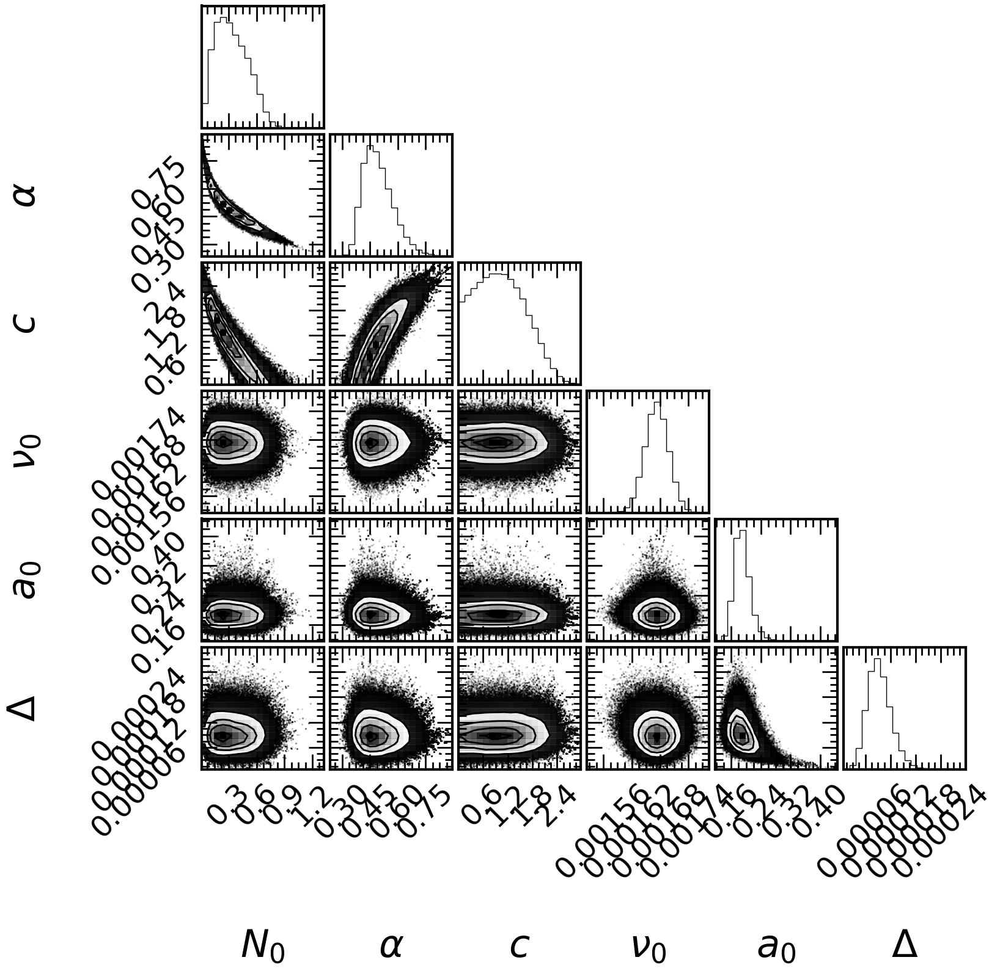

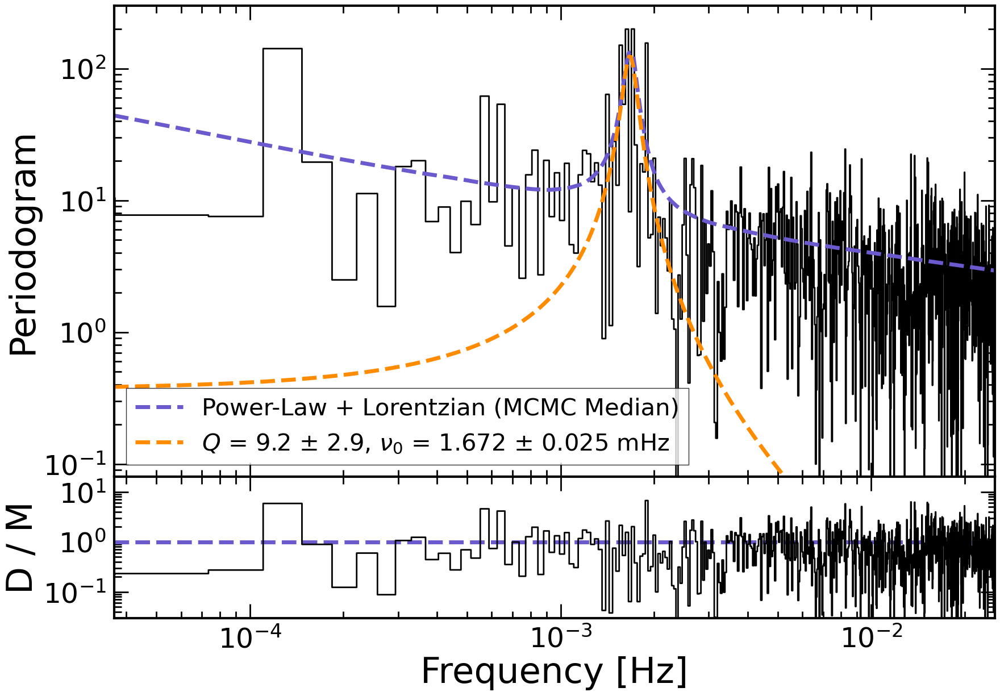

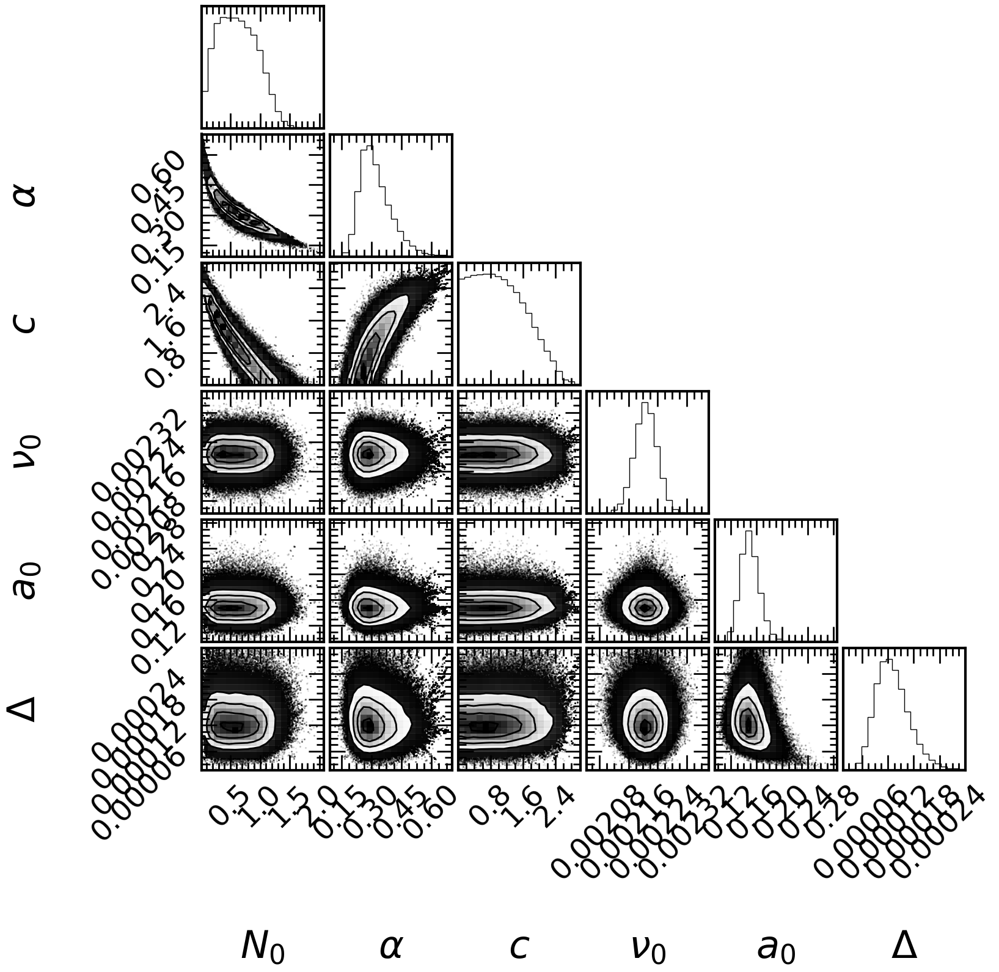

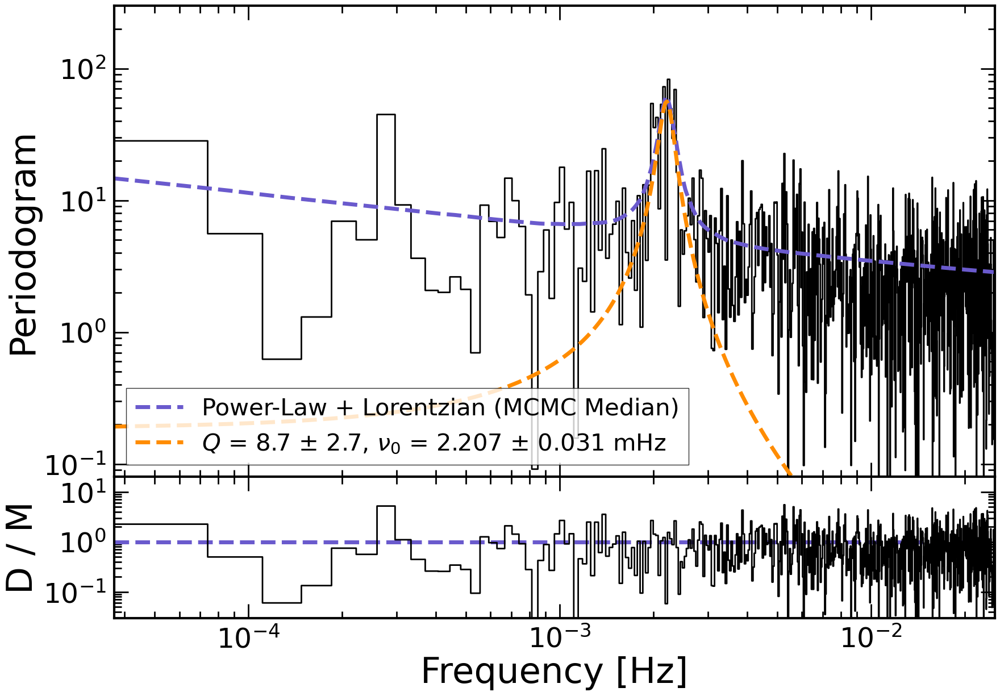

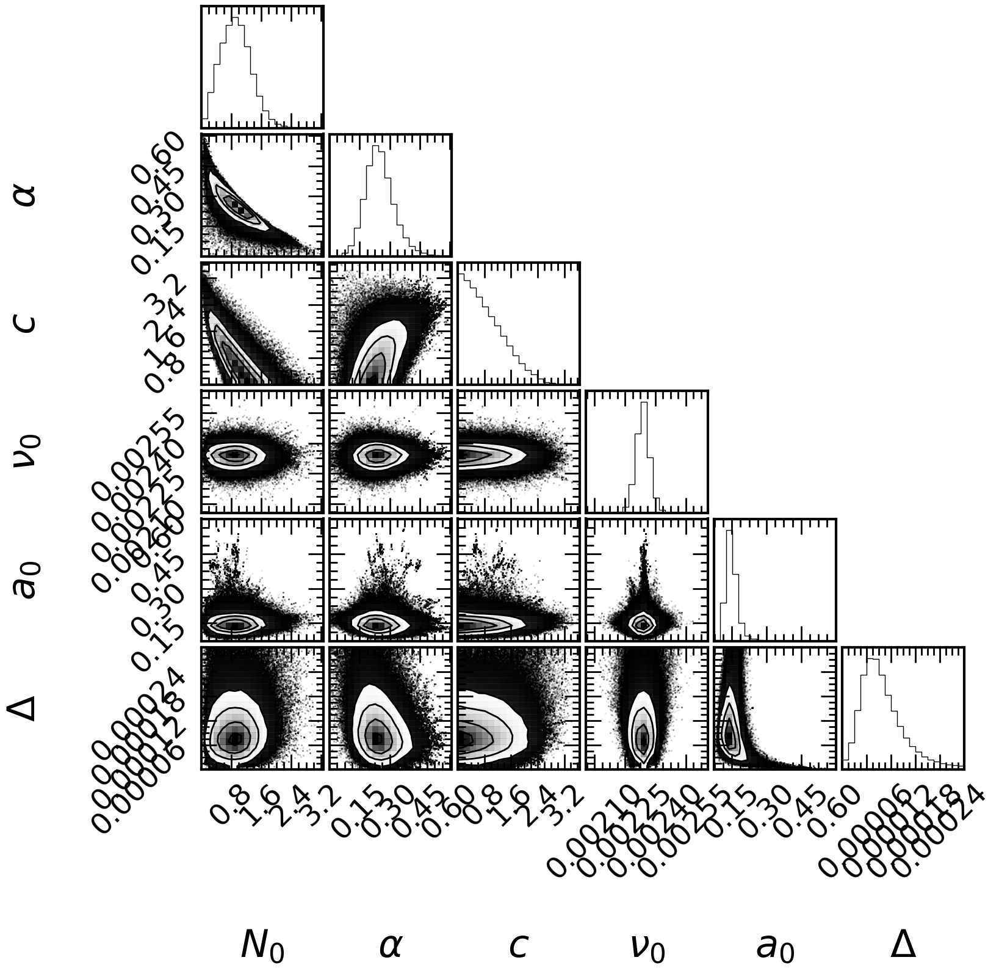

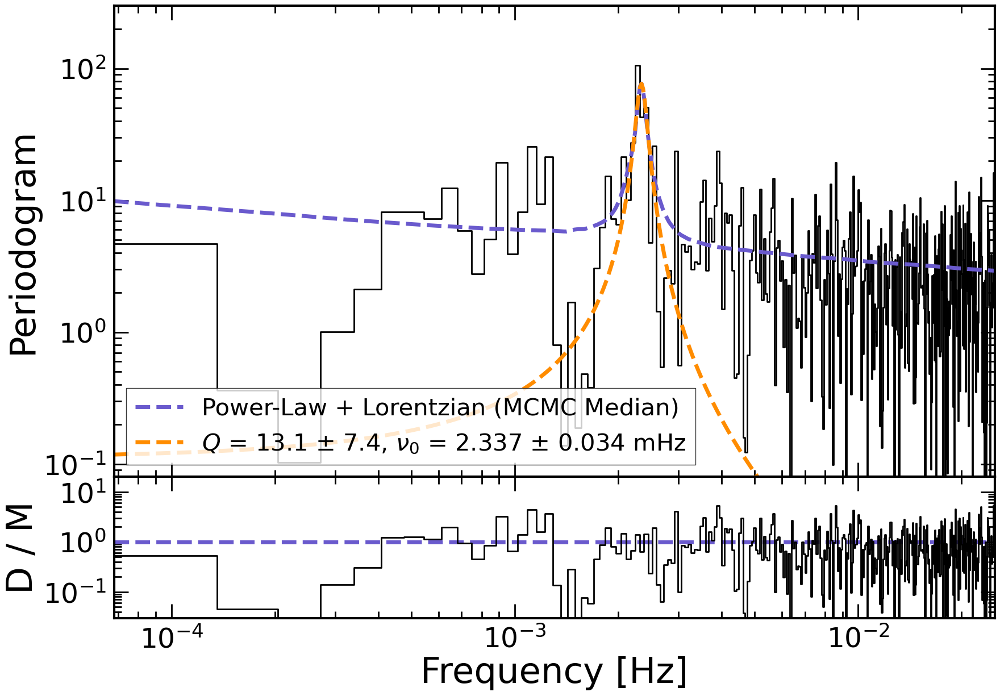

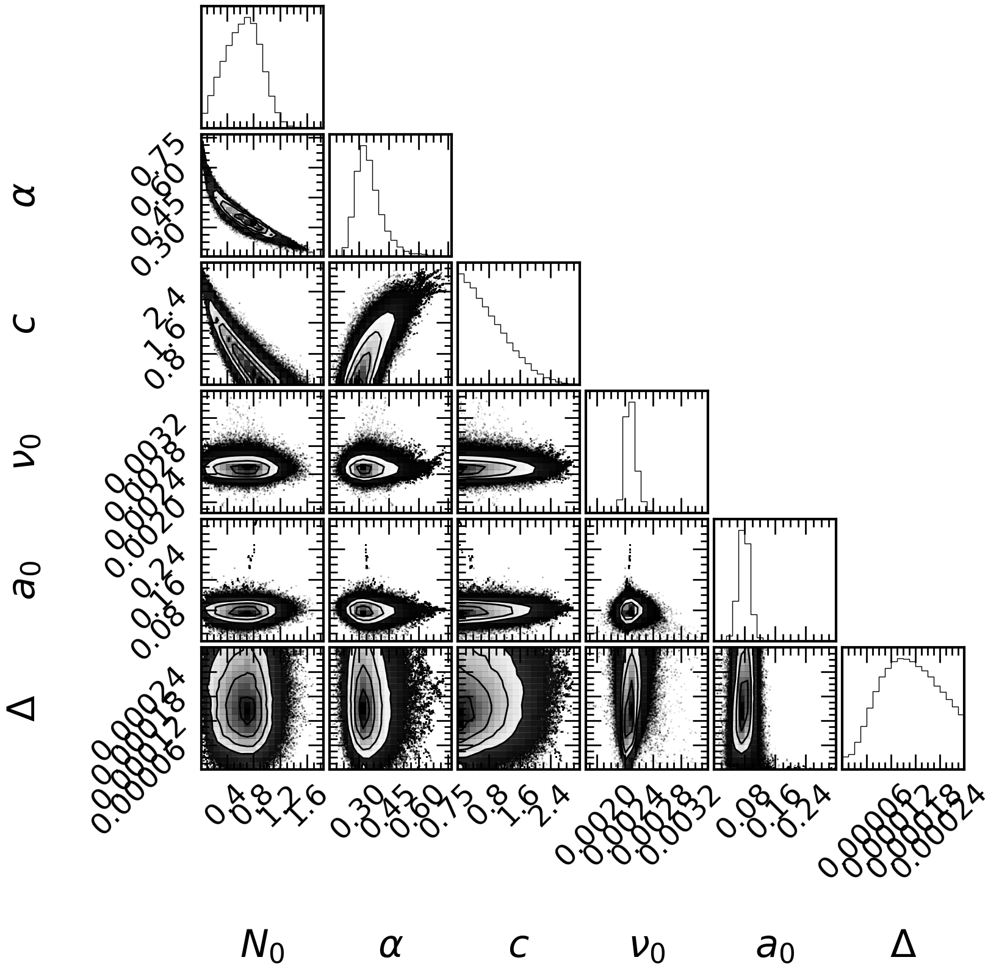

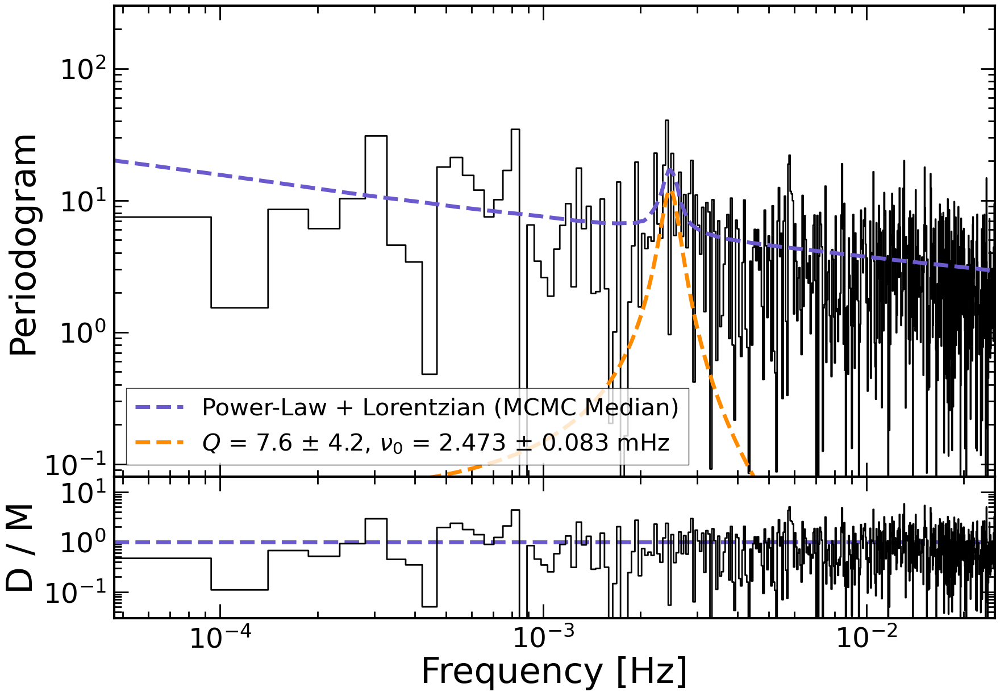

In [9]:
use_obs = np.array(['0915390701', '0931791401', '0932392001', '0932392101'])
emin = 2.
emax = 10.
tbin = 20
n = 0

# set up arrays to save data into 
qpo_freq = np.zeros((len(use_obs), 3))
Q = np.zeros((len(use_obs), 3))
rms = np.zeros((len(use_obs), 3))
char_freq = np.zeros((len(use_obs), 3))

# loop over all observations
for i, obs in enumerate(use_obs):
    qpo_freq_med, qpo_freq_std, qpo_freq_16, qpo_freq_84, Q_med, Q_err_avg, Q_16, Q_84, rms_med, rms_std, rms_16, rms_84, char_freq_med, char_freq_std, char_freq_16, char_freq_84= \
    fit_qpo_pl(obs, data_path, emin, emax, tbin=tbin, n=n, nsteps=55000, nburn=5000)

    # save qpo frequency
    qpo_freq[i,0] = qpo_freq_med
    qpo_freq[i,1] = qpo_freq_med - qpo_freq_16
    qpo_freq[i,2] = qpo_freq_84 - qpo_freq_med

    # save Q
    Q[i,0] = Q_med
    Q[i,1] = Q_med - Q_16
    Q[i,2] = Q_84 - Q_med

    # save rms
    rms[i,0] = rms_med
    rms[i,1] = rms_med - rms_16
    rms[i,2] = rms_84 - rms_med

    # same characteristic frequency
    char_freq[i,0] = char_freq_med
    char_freq[i,1] = char_freq_med - char_freq_16
    char_freq[i,2] = char_freq_84 - char_freq_med

In [10]:
np.save(mcmc_path_qpo+'qpo_freq_'+str(emin)+'-'+str(emax)+'keV.npy', qpo_freq)
np.save(mcmc_path_qpo+'Q_'+str(emin)+'-'+str(emax)+'keV.npy', Q)
np.save(mcmc_path_qpo+'rms_'+str(emin)+'-'+str(emax)+'keV.npy', rms)
np.save(mcmc_path_qpo+'char_freq_'+str(emin)+'-'+str(emax)+'keV.npy', char_freq)

In [11]:
emin = 2.
emax = 10.
qpo_freq = np.load(mcmc_path_qpo+'qpo_freq_'+str(emin)+'-'+str(emax)+'keV.npy')
Q = np.load(mcmc_path_qpo+'Q_'+str(emin)+'-'+str(emax)+'keV.npy')
rms = np.load(mcmc_path_qpo+'rms_'+str(emin)+'-'+str(emax)+'keV.npy')  
char_freq = np.load(mcmc_path_qpo+'char_freq_'+str(emin)+'-'+str(emax)+'keV.npy')

for i,obs in enumerate(use_obs):    
    print('ObsID: ', obs)
    print('------------------')
    print('QPO Frequency: {:.3f} - {:.3f} + {:.3f} mHz'.format(qpo_freq[i,0] / 1e-3, qpo_freq[i,1] / 1e-3, qpo_freq[i,2] / 1e-3))
    print('QPO Q Factor: {:.1f} - {:.1f} + {:.1f}'.format(Q[i,0], Q[i,1], Q[i,2]))
    print('QPO RMS: {:.1f} - {:.1f} + {:.1f} %'.format(rms[i,0] * 100, rms[i,1] * 100, rms[i,2] * 100))
    print('Characteristic Frequency: {:.3f} - {:.3f} + {:.3f} mHz'.format(char_freq[i,0] / 1e-3, char_freq[i,1] / 1e-3, char_freq[i,2] / 1e-3))
    print('------------------------------------------------------------------')

ObsID:  0915390701
------------------
QPO Frequency: 1.672 - 0.025 + 0.025 mHz
QPO Q Factor: 9.2 - 2.3 + 3.5
QPO RMS: 18.7 - 1.8 + 2.2 %
Characteristic Frequency: 1.675 - 0.025 + 0.025 mHz
------------------------------------------------------------------
ObsID:  0931791401
------------------
QPO Frequency: 2.207 - 0.031 + 0.031 mHz
QPO Q Factor: 8.7 - 2.2 + 3.1
QPO RMS: 14.8 - 1.3 + 1.5 %
Characteristic Frequency: 2.211 - 0.031 + 0.031 mHz
------------------------------------------------------------------
ObsID:  0932392001
------------------
QPO Frequency: 2.337 - 0.032 + 0.031 mHz
QPO Q Factor: 13.1 - 5.2 + 9.6
QPO RMS: 14.6 - 2.0 + 2.6 %
Characteristic Frequency: 2.339 - 0.032 + 0.032 mHz
------------------------------------------------------------------
ObsID:  0932392101
------------------
QPO Frequency: 2.473 - 0.063 + 0.085 mHz
QPO Q Factor: 7.6 - 2.4 + 6.0
QPO RMS: 7.8 - 1.4 + 1.4 %
Characteristic Frequency: 2.479 - 0.064 + 0.087 mHz
-------------------------------------------

#### 0.3-2 keV, all obs with *strong* QPO (e.g. only Feb. 2023, Aug. 2023, first obs from Mar. 2024) - this code is used to find the 0.3-2 keV RMS for making the RMS vs. energy figure for the paper (this is only possible in the data with the strongest QPO, since the weak QPOs only show up in 2-10 keV band)

YOU HAVE A SERIOUS PROBLEM. YOUR DATA IS NOT CONTINUOUS. YOU ARE LINEARLY INTERPOLATING THE GAPS. MAKE SURE THAT THESE ARE NOT TOO LONG.


100%|██████████| 55000/55000 [07:25<00:00, 123.56it/s]


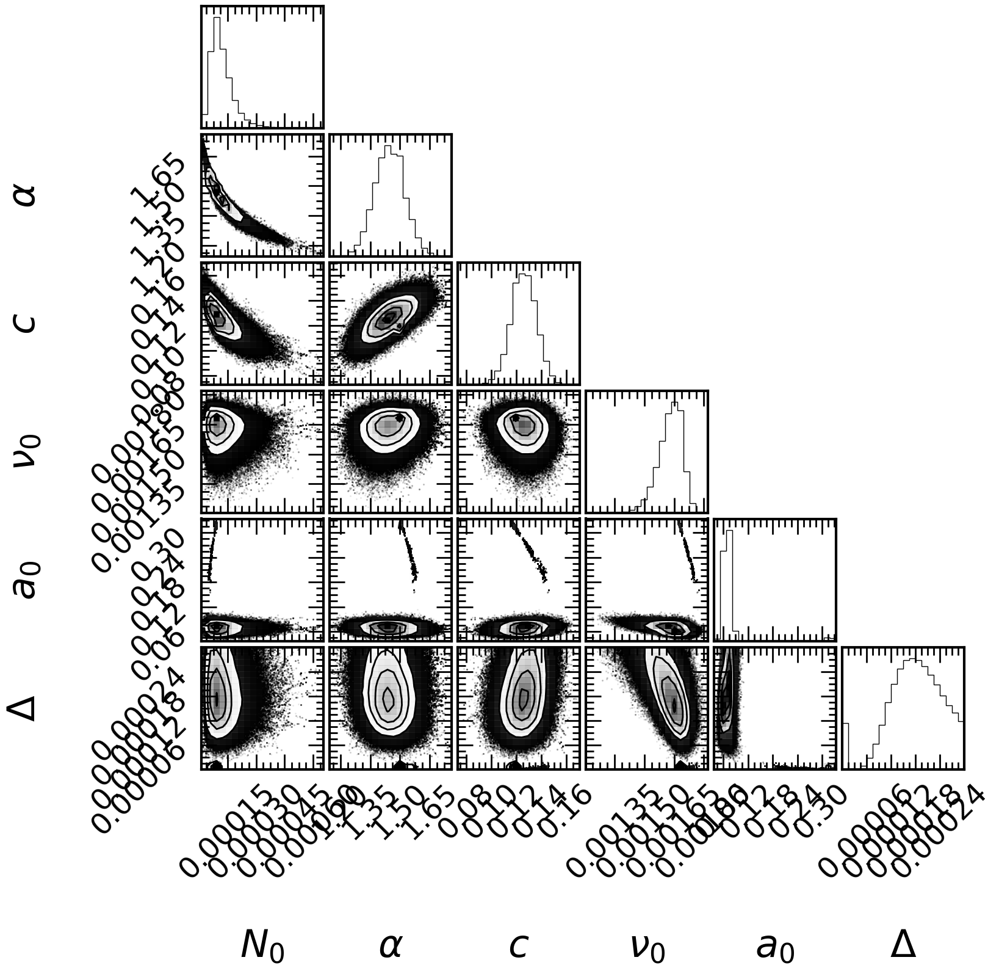

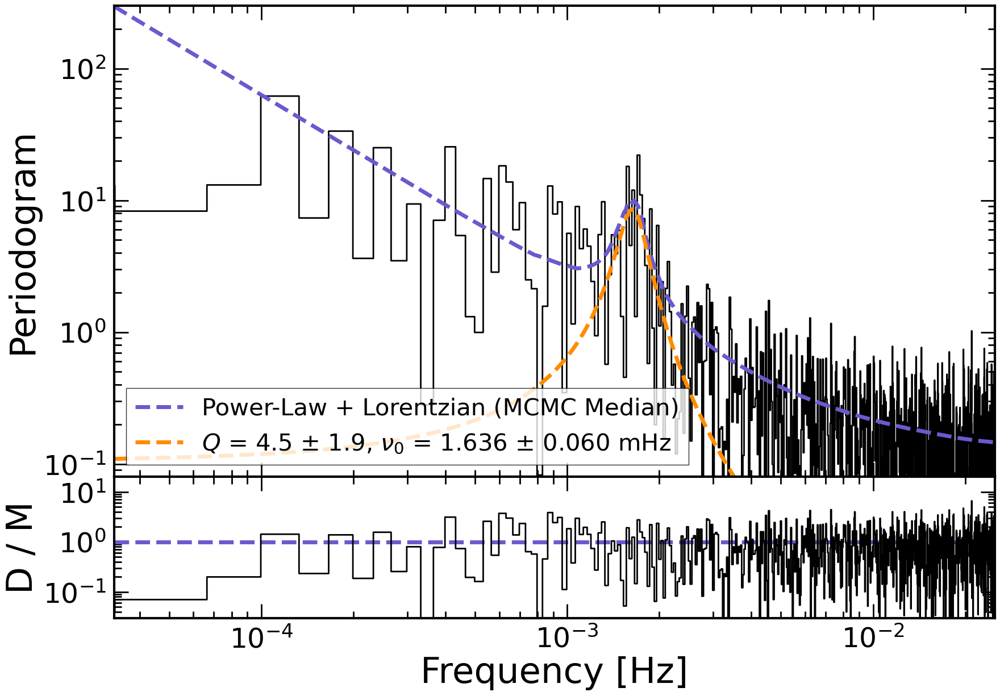

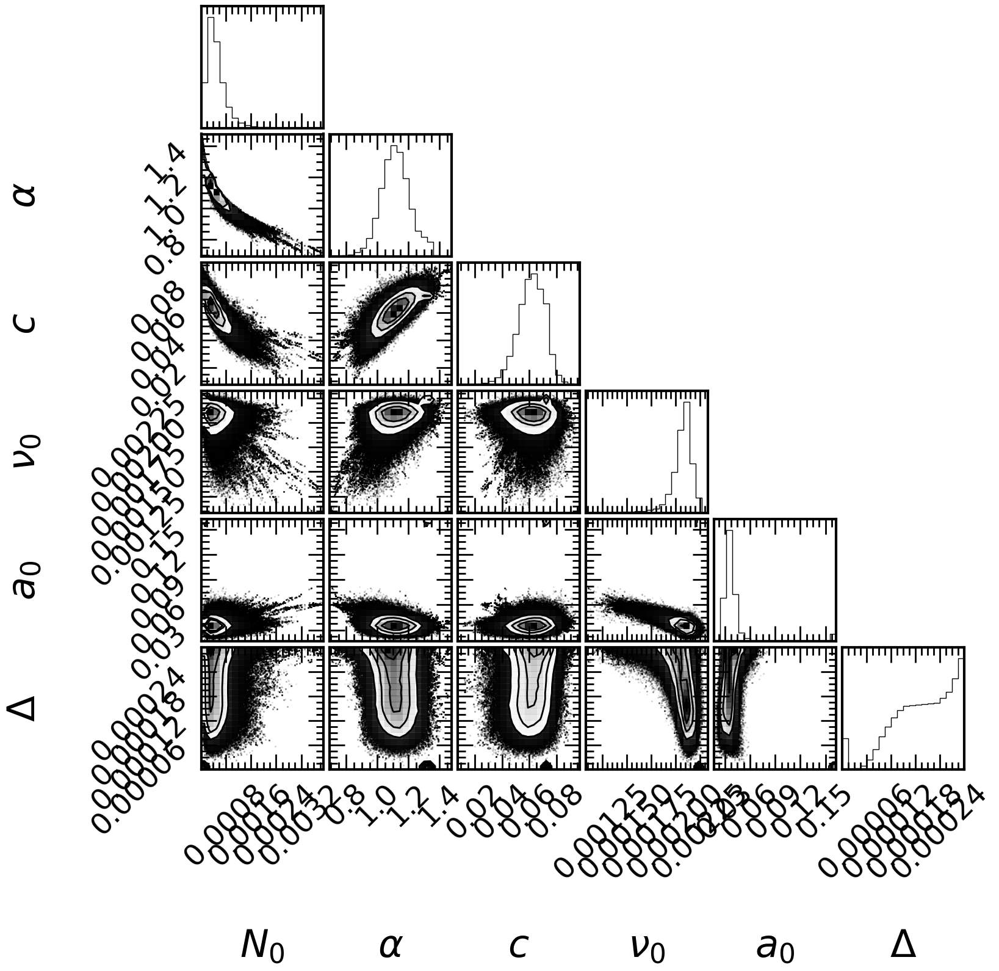

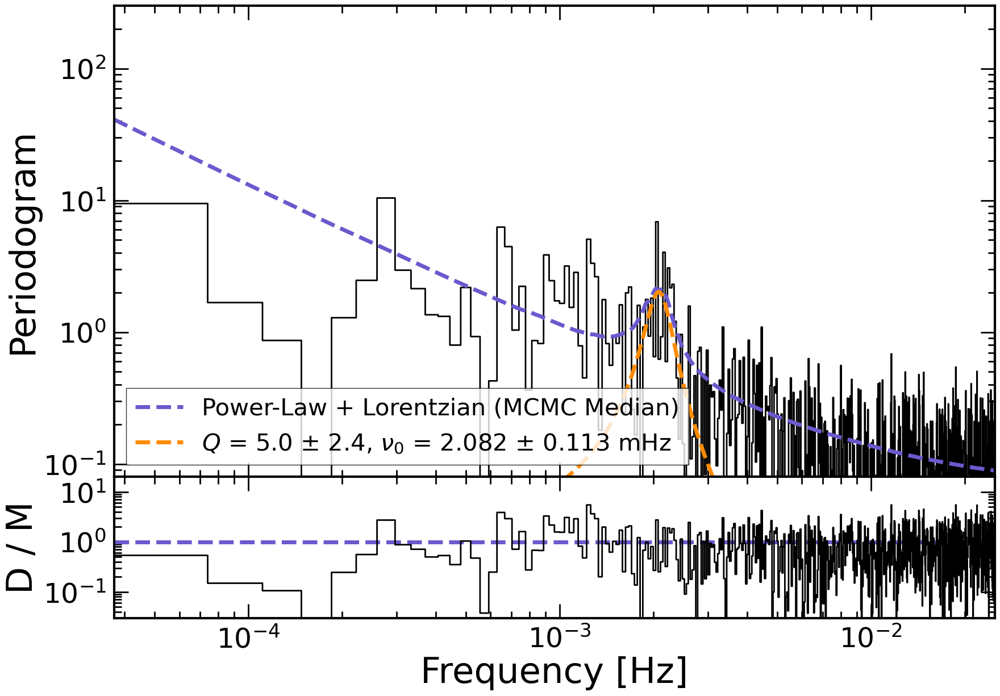

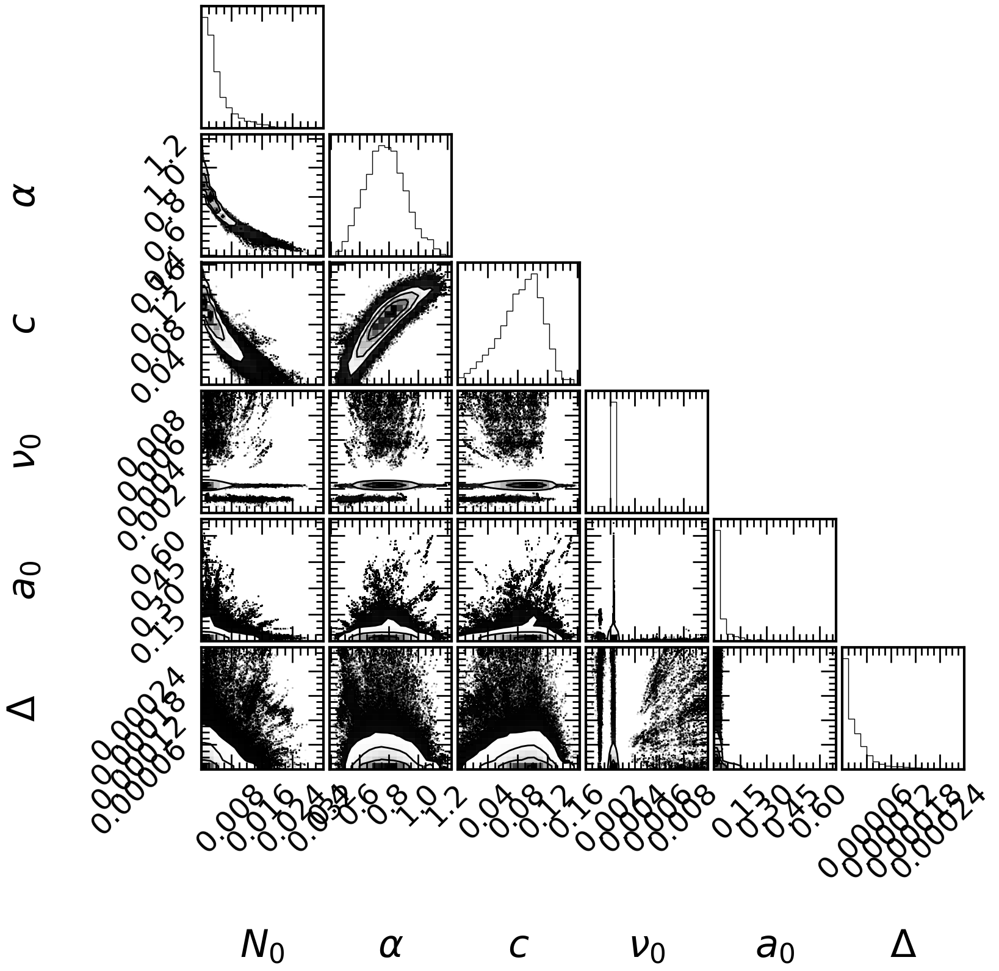

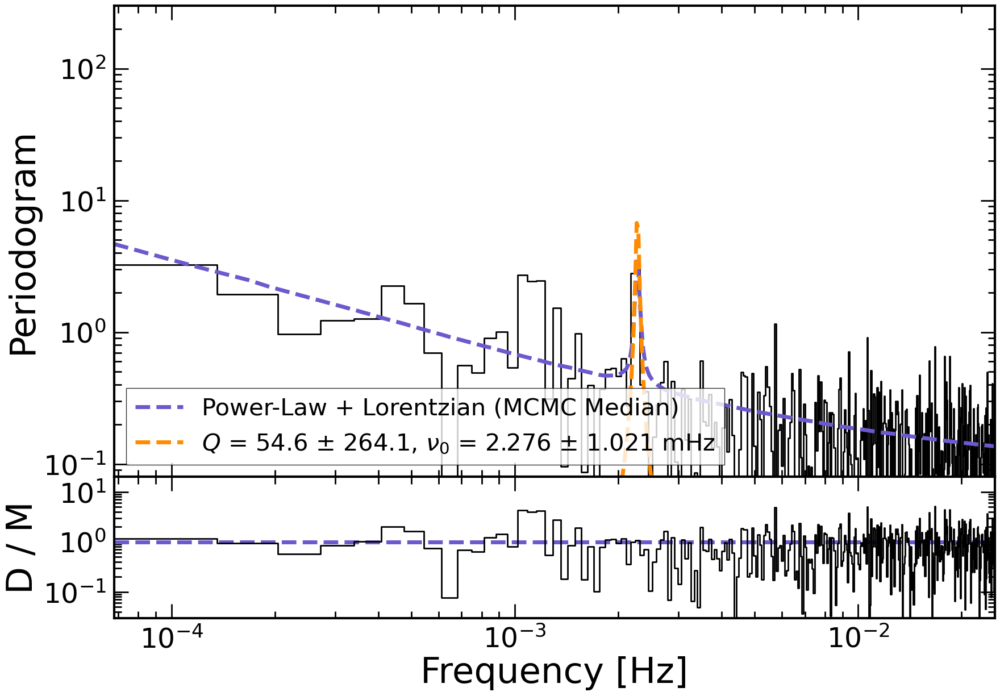

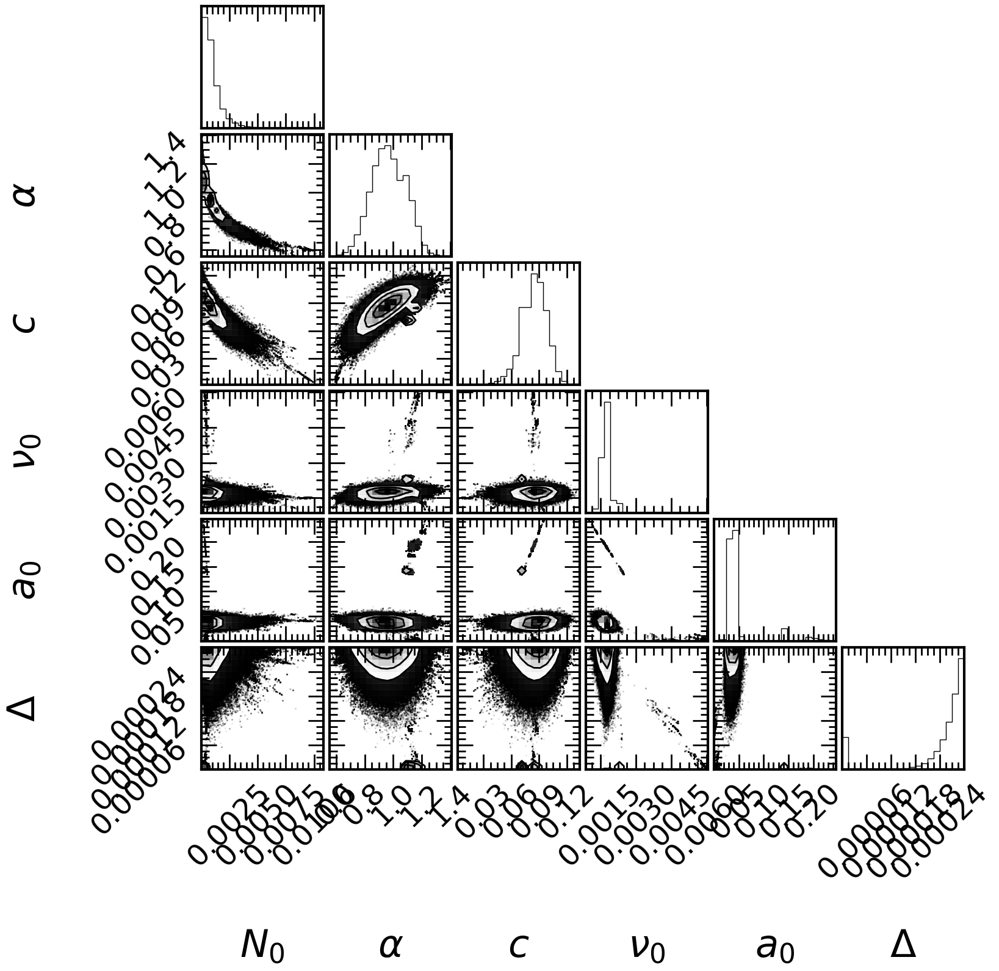

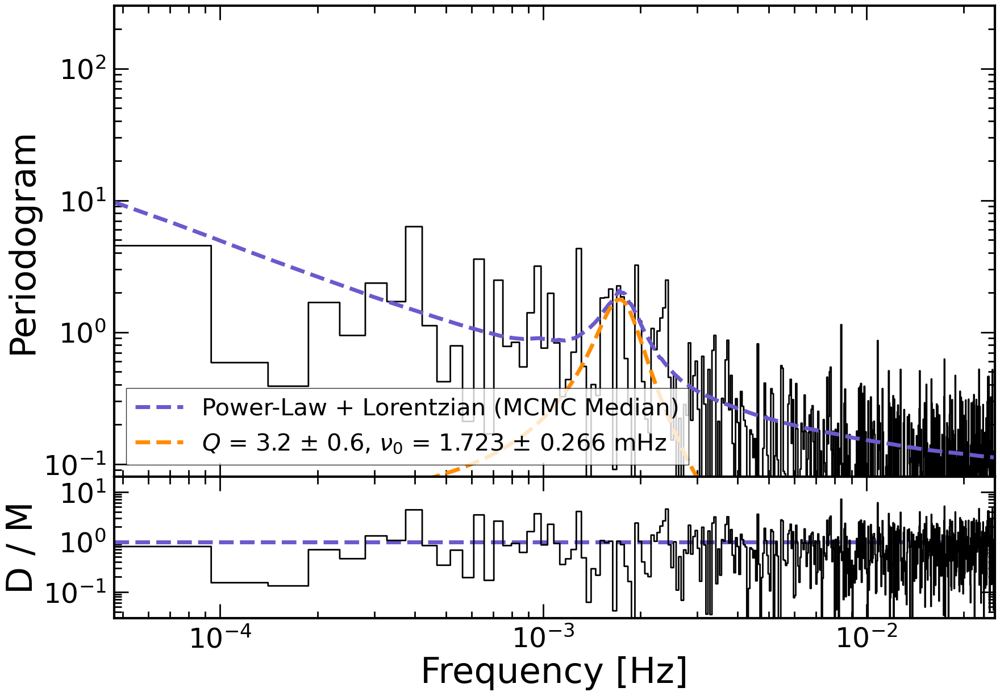

In [15]:
use_obs = np.array(['0915390701', '0931791401', '0932392001', '0932392101'])
emin = 0.3
emax = 2.
tbin = 20
n = 0

# set up arrays to save data into 
qpo_freq = np.zeros((len(use_obs), 3))
Q = np.zeros((len(use_obs), 3))
rms = np.zeros((len(use_obs), 3))
char_freq = np.zeros((len(use_obs), 3))

# loop over all observations
for i, obs in enumerate(use_obs):
    qpo_freq_med, qpo_freq_std, qpo_freq_16, qpo_freq_84, Q_med, Q_err_avg, Q_16, Q_84, rms_med, rms_std, rms_16, rms_84, char_freq_med, char_freq_std, char_freq_16, char_freq_84= \
    fit_qpo_pl(obs, data_path, emin, emax, tbin=tbin, n=n, nsteps=55000, nburn=5000)

    # save qpo frequency
    qpo_freq[i,0] = qpo_freq_med
    qpo_freq[i,1] = qpo_freq_med - qpo_freq_16
    qpo_freq[i,2] = qpo_freq_84 - qpo_freq_med

    # save Q
    Q[i,0] = Q_med
    Q[i,1] = Q_med - Q_16
    Q[i,2] = Q_84 - Q_med

    # save rms
    rms[i,0] = rms_med
    rms[i,1] = rms_med - rms_16
    rms[i,2] = rms_84 - rms_med

    # same characteristic frequency
    char_freq[i,0] = char_freq_med
    char_freq[i,1] = char_freq_med - char_freq_16
    char_freq[i,2] = char_freq_84 - char_freq_med

In [16]:
np.save(mcmc_path_qpo+'qpo_freq_'+str(emin)+'-'+str(emax)+'keV.npy', qpo_freq)
np.save(mcmc_path_qpo+'Q_'+str(emin)+'-'+str(emax)+'keV.npy', Q)
np.save(mcmc_path_qpo+'rms_'+str(emin)+'-'+str(emax)+'keV.npy', rms)
np.save(mcmc_path_qpo+'char_freq_'+str(emin)+'-'+str(emax)+'keV.npy', char_freq)

In [17]:
emin = 0.3
emax = 2.
qpo_freq = np.load(mcmc_path_qpo+'qpo_freq_'+str(emin)+'-'+str(emax)+'keV.npy')
Q = np.load(mcmc_path_qpo+'Q_'+str(emin)+'-'+str(emax)+'keV.npy')
rms = np.load(mcmc_path_qpo+'rms_'+str(emin)+'-'+str(emax)+'keV.npy')  
char_freq = np.load(mcmc_path_qpo+'char_freq_'+str(emin)+'-'+str(emax)+'keV.npy')

for i,obs in enumerate(use_obs):    
    print('ObsID: ', obs)
    print('------------------')
    print('QPO Frequency: {:.3f} - {:.3f} + {:.3f} mHz'.format(qpo_freq[i,0] / 1e-3, qpo_freq[i,1] / 1e-3, qpo_freq[i,2] / 1e-3))
    print('QPO Q Factor: {:.1f} - {:.1f} + {:.1f}'.format(Q[i,0], Q[i,1], Q[i,2]))
    print('QPO RMS: {:.1f} - {:.1f} + {:.1f} %'.format(rms[i,0] * 100, rms[i,1] * 100, rms[i,2] * 100))
    print('Characteristic Frequency: {:.3f} - {:.3f} + {:.3f} mHz'.format(char_freq[i,0] / 1e-3, char_freq[i,1] / 1e-3, char_freq[i,2] / 1e-3))
    print('------------------------------------------------------------------')

ObsID:  0915390701
------------------
QPO Frequency: 1.636 - 0.067 + 0.048 mHz
QPO Q Factor: 4.5 - 1.3 + 2.4
QPO RMS: 6.9 - 0.7 + 0.9 %
Characteristic Frequency: 1.646 - 0.061 + 0.045 mHz
------------------------------------------------------------------
ObsID:  0931791401
------------------
QPO Frequency: 2.082 - 0.101 + 0.066 mHz
QPO Q Factor: 5.0 - 1.4 + 3.4
QPO RMS: 3.6 - 0.5 + 0.6 %
Characteristic Frequency: 2.092 - 0.095 + 0.063 mHz
------------------------------------------------------------------
ObsID:  0932392001
------------------
QPO Frequency: 2.276 - 0.021 + 0.017 mHz
QPO Q Factor: 54.6 - 36.2 + 491.9
QPO RMS: 2.4 - 0.7 + 3.9 %
Characteristic Frequency: 2.276 - 0.021 + 0.017 mHz
------------------------------------------------------------------
ObsID:  0932392101
------------------
QPO Frequency: 1.723 - 0.139 + 0.152 mHz
QPO Q Factor: 3.2 - 0.4 + 0.8
QPO RMS: 3.8 - 0.6 + 0.8 %
Characteristic Frequency: 1.744 - 0.137 + 0.150 mHz
-------------------------------------------

## Run lorentzian fit on different observations in different energy ranges

#### 2-10 keV, all observations with QPO - this is just used to test consistency with the power-law numbers in the 2-10 keV section above (which is what is quoted in Table 2 of the paper)

YOU HAVE A SERIOUS PROBLEM. YOUR DATA IS NOT CONTINUOUS. YOU ARE LINEARLY INTERPOLATING THE GAPS. MAKE SURE THAT THESE ARE NOT TOO LONG.


100%|██████████| 55000/55000 [07:16<00:00, 125.97it/s]


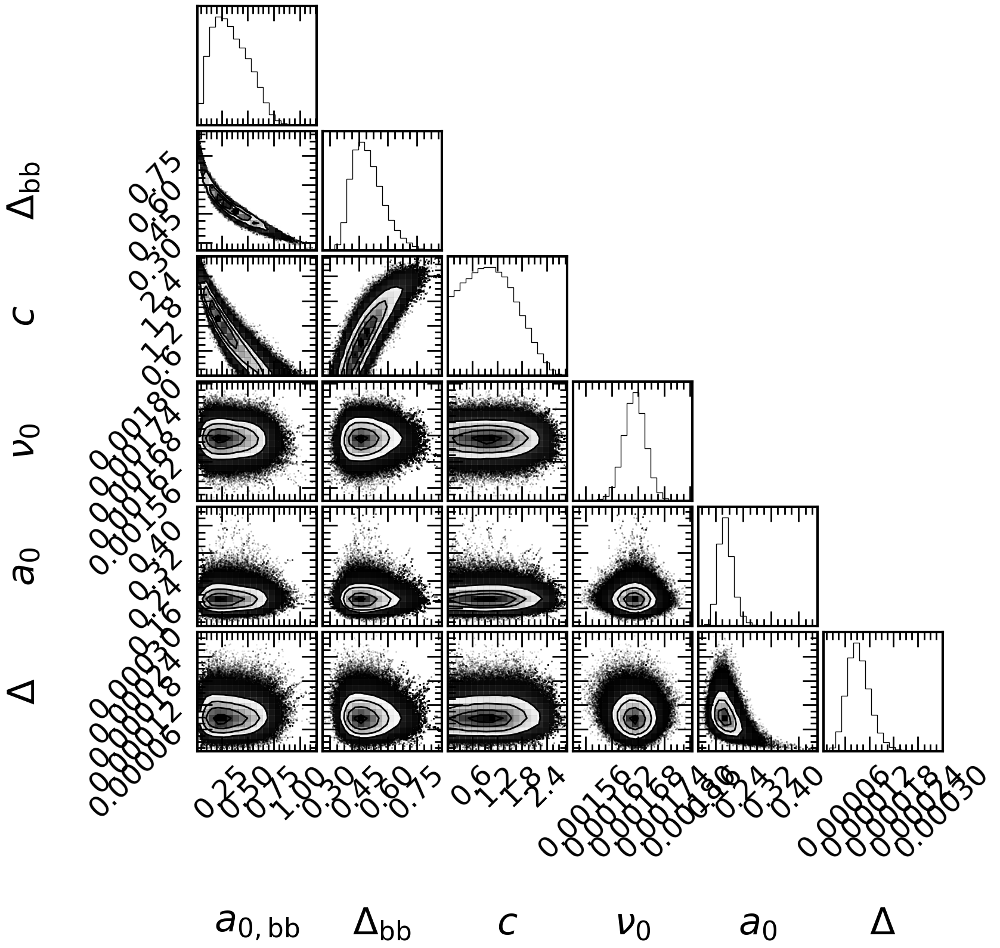

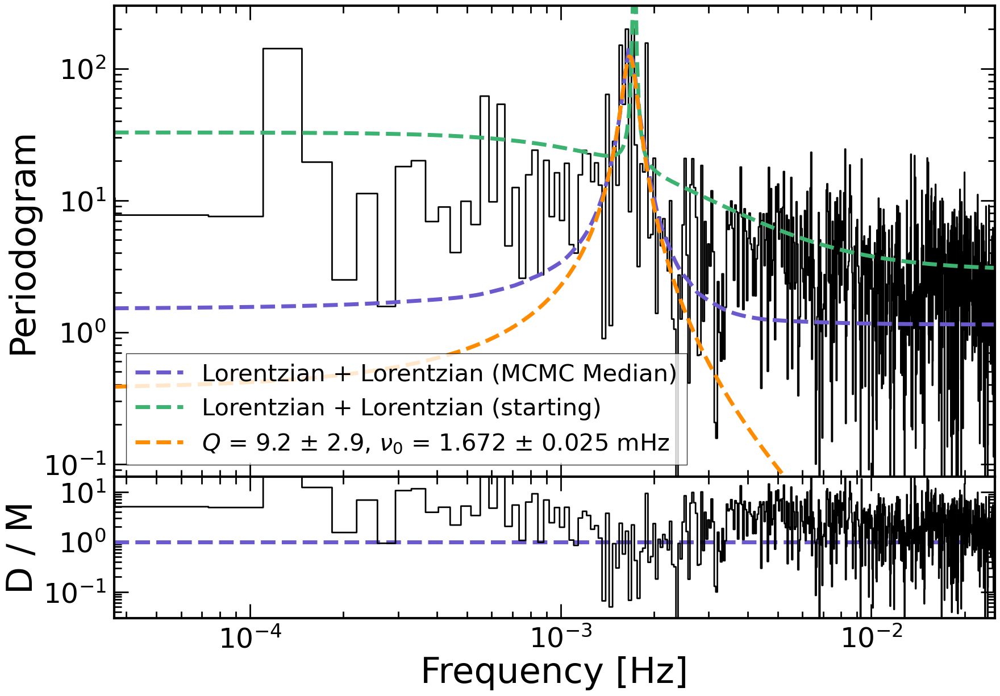

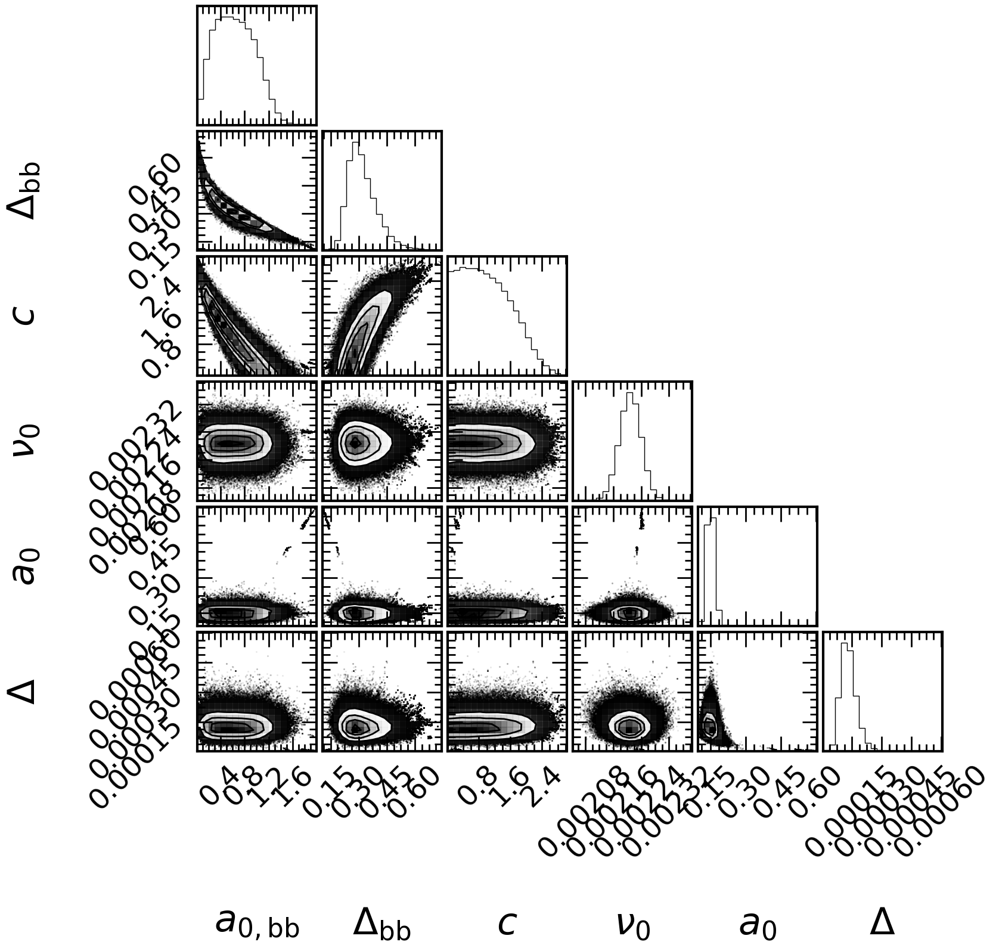

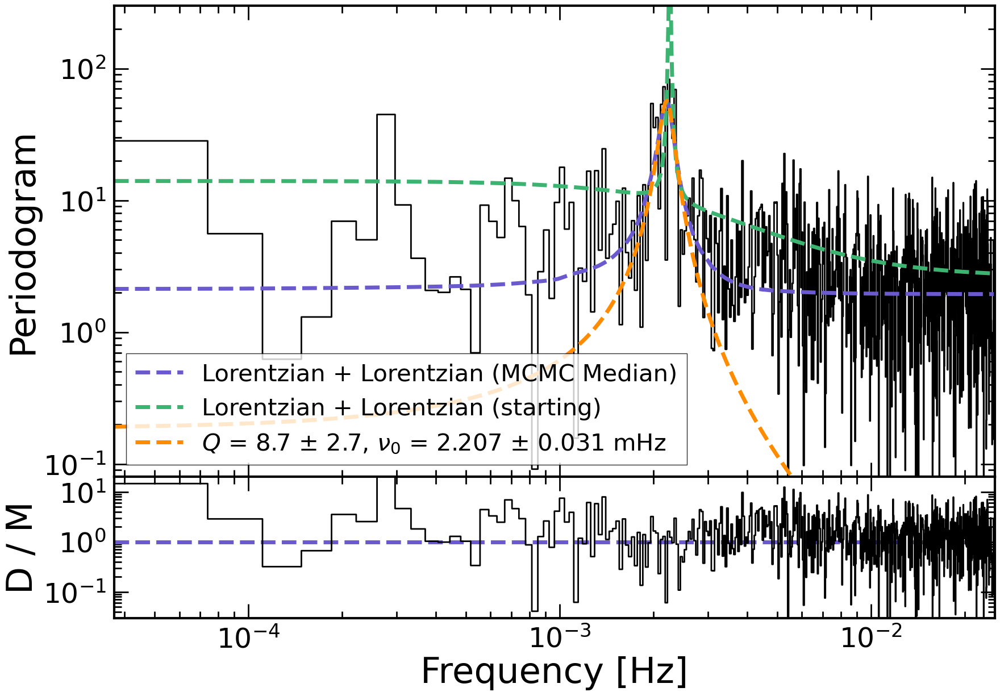

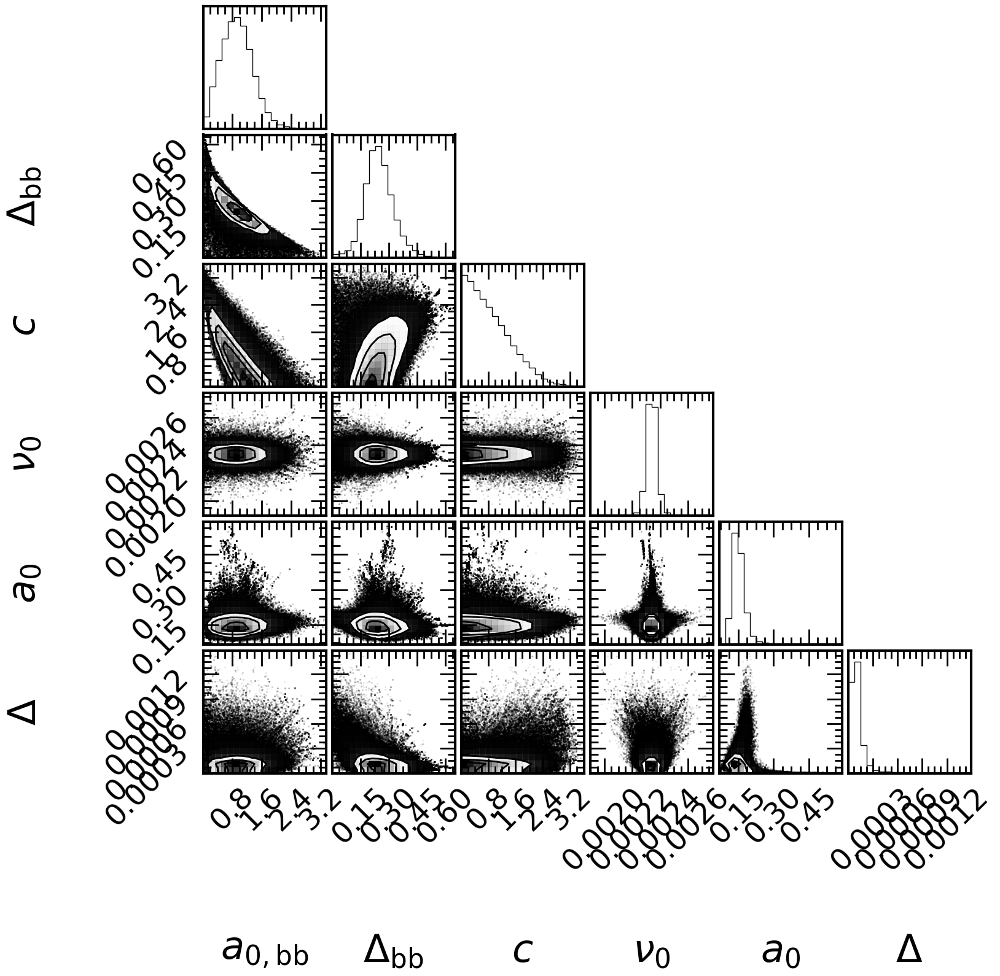

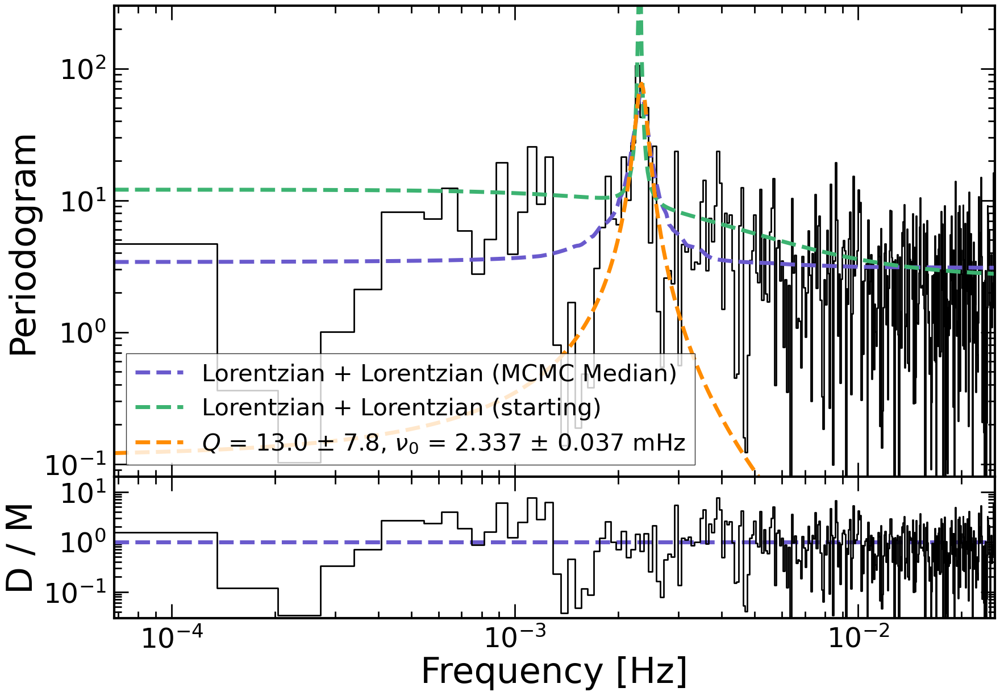

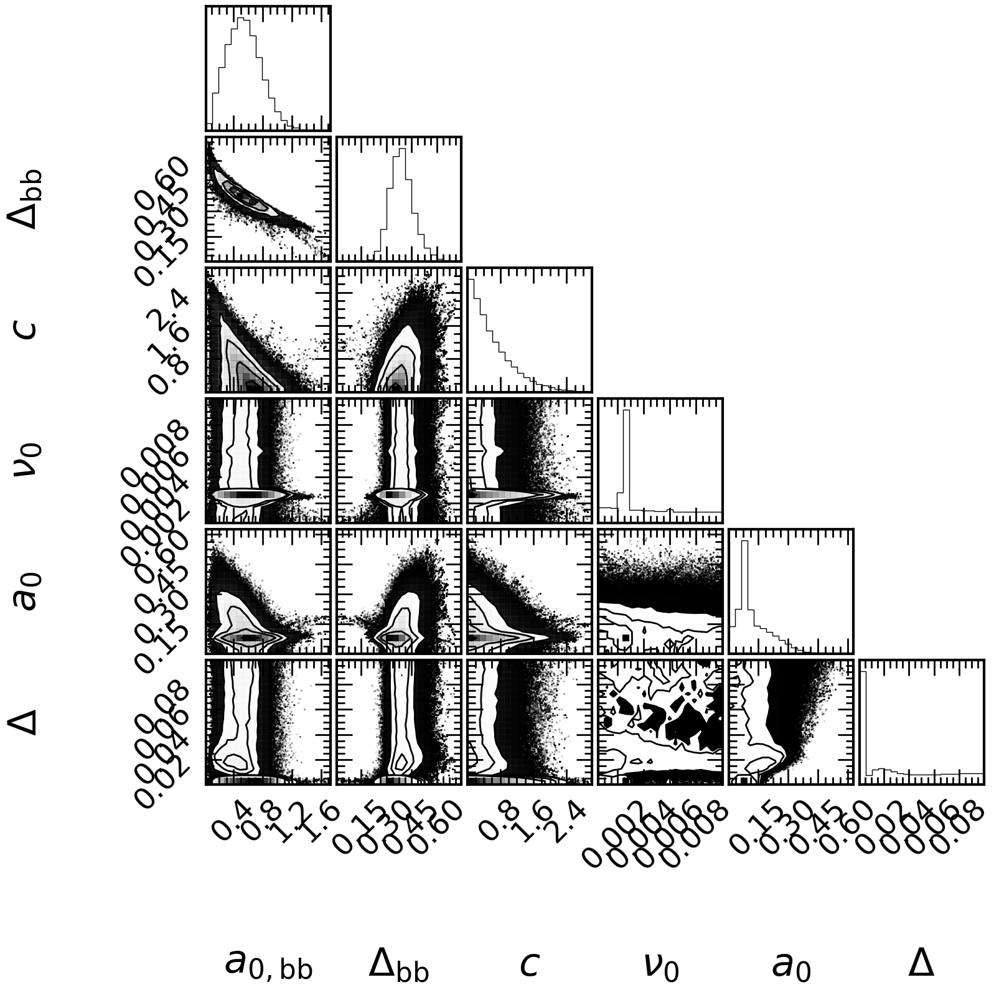

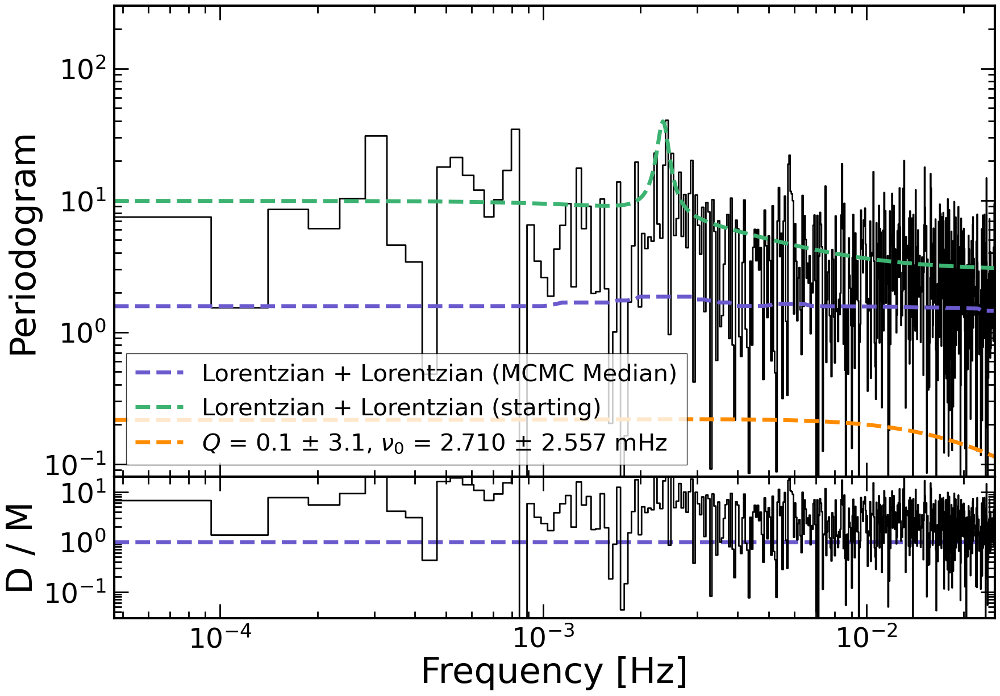

In [19]:
use_obs = np.array(['0915390701', '0931791401', '0932392001', '0932392101'])
emin = 2.
emax = 10.
tbin = 20
n = 0

# set up arrays to save data into 
qpo_freq = np.zeros((len(use_obs), 3))
Q = np.zeros((len(use_obs), 3))
rms = np.zeros((len(use_obs), 3))
char_freq = np.zeros((len(use_obs), 3))

# loop over all observations
for i, obs in enumerate(use_obs):
    if obs == '0932392101':
        qpo_freq_med, qpo_freq_std, qpo_freq_16, qpo_freq_84, Q_med, Q_err_avg, Q_16, Q_84, rms_med, rms_std, rms_16, rms_84, char_freq_med, char_freq_std, char_freq_16, char_freq_84= \
        fit_qpo_lor(obs, data_path, emin, emax, tbin=tbin, n=n, nsteps=55000, nburn=5000, start_freq=2.35e-3)
    else:
        qpo_freq_med, qpo_freq_std, qpo_freq_16, qpo_freq_84, Q_med, Q_err_avg, Q_16, Q_84, rms_med, rms_std, rms_16, rms_84, char_freq_med, char_freq_std, char_freq_16, char_freq_84= \
        fit_qpo_lor(obs, data_path, emin, emax, tbin=tbin, n=n, nsteps=55000, nburn=5000)

    # save qpo frequency
    qpo_freq[i,0] = qpo_freq_med
    qpo_freq[i,1] = qpo_freq_med - qpo_freq_16
    qpo_freq[i,2] = qpo_freq_84 - qpo_freq_med

    # save Q
    Q[i,0] = Q_med
    Q[i,1] = Q_med - Q_16
    Q[i,2] = Q_84 - Q_med

    # save rms
    rms[i,0] = rms_med
    rms[i,1] = rms_med - rms_16
    rms[i,2] = rms_84 - rms_med

    # same characteristic frequency
    char_freq[i,0] = char_freq_med
    char_freq[i,1] = char_freq_med - char_freq_16
    char_freq[i,2] = char_freq_84 - char_freq_med

In [20]:
np.save(mcmc_path_qpo+'qpo_freq_'+str(emin)+'-'+str(emax)+'keV_lorbb.npy', qpo_freq)
np.save(mcmc_path_qpo+'Q_'+str(emin)+'-'+str(emax)+'keV_lorbb.npy', Q)
np.save(mcmc_path_qpo+'rms_'+str(emin)+'-'+str(emax)+'keV_lorbb.npy', rms)
np.save(mcmc_path_qpo+'char_freq_'+str(emin)+'-'+str(emax)+'keV_lorbb.npy', char_freq)

In [21]:
emin = 2.
emax = 10.
qpo_freq = np.load(mcmc_path_qpo+'qpo_freq_'+str(emin)+'-'+str(emax)+'keV_lorbb.npy')
Q = np.load(mcmc_path_qpo+'Q_'+str(emin)+'-'+str(emax)+'keV_lorbb.npy')
rms = np.load(mcmc_path_qpo+'rms_'+str(emin)+'-'+str(emax)+'keV_lorbb.npy')  
char_freq = np.load(mcmc_path_qpo+'char_freq_'+str(emin)+'-'+str(emax)+'keV_lorbb.npy')

for i,obs in enumerate(use_obs):    
    print('ObsID: ', obs)
    print('------------------')
    print('QPO Frequency: {:.3f} - {:.3f} + {:.3f} mHz'.format(qpo_freq[i,0] / 1e-3, qpo_freq[i,1] / 1e-3, qpo_freq[i,2] / 1e-3))
    print('QPO Q Factor: {:.1f} - {:.1f} + {:.1f}'.format(Q[i,0], Q[i,1], Q[i,2]))
    print('QPO RMS: {:.1f} - {:.1f} + {:.1f} %'.format(rms[i,0] * 100, rms[i,1] * 100, rms[i,2] * 100))
    print('Characteristic Frequency: {:.3f} - {:.3f} + {:.3f} mHz'.format(char_freq[i,0] / 1e-3, char_freq[i,1] / 1e-3, char_freq[i,2] / 1e-3))
    print('------------------------------------------------------------------')

ObsID:  0915390701
------------------
QPO Frequency: 1.672 - 0.025 + 0.024 mHz
QPO Q Factor: 9.2 - 2.3 + 3.5
QPO RMS: 18.7 - 1.8 + 2.3 %
Characteristic Frequency: 1.674 - 0.025 + 0.025 mHz
------------------------------------------------------------------
ObsID:  0931791401
------------------
QPO Frequency: 2.207 - 0.031 + 0.030 mHz
QPO Q Factor: 8.7 - 2.2 + 3.2
QPO RMS: 14.9 - 1.4 + 1.6 %
Characteristic Frequency: 2.211 - 0.031 + 0.030 mHz
------------------------------------------------------------------
ObsID:  0932392001
------------------
QPO Frequency: 2.337 - 0.033 + 0.032 mHz
QPO Q Factor: 13.0 - 5.5 + 10.0
QPO RMS: 14.6 - 2.0 + 2.7 %
Characteristic Frequency: 2.340 - 0.032 + 0.033 mHz
------------------------------------------------------------------
ObsID:  0932392101
------------------
QPO Frequency: 2.710 - 0.433 + 4.764 mHz
QPO Q Factor: 0.1 - 0.1 + 6.1
QPO RMS: 9.2 - 3.6 + 12.2 %
Characteristic Frequency: 23.895 - 21.404 + 52.388 mHz
--------------------------------------

## Look at RMS vs. Energy for the three observations

For the full figure creation, see Masterson24b_paper_figures.ipynb

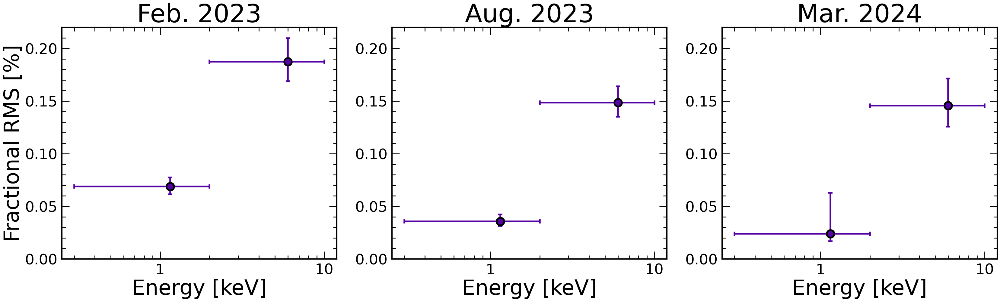

In [23]:
fig, axs = plt.subplots(figsize=(40,10), ncols=3)

use_obs = np.array(['0915390701', '0931791401', '0932392001'])
use_times = np.array(['Feb. 2023', 'Aug. 2023', 'Mar. 2024'])
use_emin = np.array([2., 0.3])
use_emax = np.array([10., 2.])

# qpo_freq = np.array([1.67e-3, 2.21e-3, 2.35e-3]) # based on the centroid of the lorentzian, in Hz, time will be given in s
qpo_freq = np.array([1.65e-3, 2.19e-3, 2.31e-3]) # based on the peak freq in the PSD, in Hz, time will be given in s
qpo_per = 1 / qpo_freq

color = (0.331426, 0.006261, 0.641316, 1.0)

for i,obsid in enumerate(use_obs):

    ax = axs[i]
    if i == 0:
        ax.set_ylabel('Fractional RMS [%]', fontsize=50)

    for j,emin in enumerate(use_emin):
        emax = use_emax[j]

        rms = np.load(mcmc_path_qpo+'rms_'+str(emin)+'-'+str(emax)+'keV.npy')

        ax.errorbar((emin + emax) / 2, rms[i,0], xerr=(emax - emin) / 2, yerr=[[rms[i,1]],[rms[i,2]]],
                    fmt='o', ms=18, lw=4, capsize=5, color=color, mew=4, mec='k')
           
    ax.set_title(use_times[i], fontsize=60)
    ax.set_xlabel('Energy [keV]', fontsize=50)
    ax.set_xscale('log')
    ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))
    ax.set_ylim(0,0.22)

## Compare AIC for with and without Lorentzian (for both the power-law and Lorentzian broadband noise models)

### Power-Law Broadband Noise Model

In [28]:
def get_AIC_pl(obs, emin, emax, tbin, nburn=5000, tmin=None, tmax=None):

    # get data
    _, _, _, freq, power, _, _, f_min, f_max, _, _ = make_psd(obs, data_path, emin, emax, tbin, 0, tmin, tmax)

    # dimensions to be used in the computation of AIC
    k_pl = 3
    k_qpo_pl = 6
    n = len(freq)

    # load in the data from mcmc fits - without the QPO
    fname = mcmc_path_bb+'broadband_'+obs+'_'+str(emin)+'-'+str(emax)+'keV_mcmc_powerlaw.h5'
    backend = emcee.backends.HDFBackend(fname)
    if os.path.exists(fname):
        samples = backend.get_chain(discard=nburn, flat=True)
        negloglike_pl = min(-backend.get_log_prob(discard=nburn, flat=True))
    # grab the mcmc data to plot the MCMC model instead of the MLE
    n_rand = 100
    grid_mcmc = np.linspace(f_min, f_max, 1000)
    fit_bb = np.zeros((len(grid_mcmc),n_rand))
    fit_bb_binned = np.zeros((len(freq),n_rand))
    for i in range(n_rand):
        use_R_bb, use_D_bb, use_c = samples[i,:]
        fit_bb[:,i] = powerlaw(grid_mcmc, use_R_bb, use_D_bb, use_c)
        fit_bb_binned[:,i] = powerlaw(freq, use_R_bb, use_D_bb, use_c)
    med_bb_fit = np.median(fit_bb, axis=1)
    med_bb_fit_16 = np.percentile(fit_bb, 16, axis=1)
    med_bb_fit_84 = np.percentile(fit_bb, 84, axis=1)
    med_bb_fit_binned = np.median(fit_bb_binned, axis=1)

    # load in the data from mcmc fits - with the QPO
    fname = mcmc_path_qpo+'qpo_'+obs+'_'+str(emin)+'-'+str(emax)+'keV_mcmc_powerlaw.h5'
    backend = emcee.backends.HDFBackend(fname)
    if os.path.exists(fname):
        samples = backend.get_chain(discard=nburn, flat=True)
        negloglike_qpo_pl = min(-backend.get_log_prob(discard=nburn, flat=True))
        best_loc = np.argmin(-backend.get_log_prob(discard=nburn, flat=True))
    # grab the mcmc data to plot the MCMC model instead of the MLE
    fit = np.zeros((len(grid_mcmc),n_rand))
    fit_binned = np.zeros((len(freq),n_rand))
    for i in range(n_rand):
        use_R_bb, use_D_bb, use_c, use_nu0, use_R, use_D = samples[i,:]
        fit[:,i] = qpo_pl(grid_mcmc, use_R_bb, use_D_bb, use_c, use_nu0, use_R, use_D)
        fit_binned[:,i] = qpo_pl(freq, use_R_bb, use_D_bb, use_c, use_nu0, use_R, use_D)
    med_fit = np.median(fit, axis=1)
    med_fit_16 = np.percentile(fit, 16, axis=1)
    med_fit_84 = np.percentile(fit, 84, axis=1)
    med_fit_binned = np.median(fit_binned, axis=1)

    # compute AIC
    AIC_pl = 2 * k_pl + negloglike_pl + ((2 * k_pl * (k_pl + 1)) / (n - k_pl - 1))
    AIC_qpo_pl = 2 * k_qpo_pl + negloglike_qpo_pl + ((2 * k_qpo_pl * (k_qpo_pl + 1)) / (n - k_qpo_pl - 1))
    delta_AIC = AIC_pl - AIC_qpo_pl
    ep = np.exp(-delta_AIC / 2)
    print('''Delta AIC = {:.2f}
epsilon = {:.2e}'''.format(delta_AIC, ep))

    # quick plot
    fig, axs = plt.subplots(figsize=(12,14), nrows=3, sharex=True, gridspec_kw={'hspace':0, 'height_ratios':[1,0.3,0.3]})
    ax = axs[0]
    ax.step(freq, power, lw=2, color='k')
    grid = np.linspace(min(freq), max(freq), 1000)
    ax.plot(grid_mcmc, med_bb_fit, color='darkorange', lw=3, ls='-', label='Power-Law only')
    ax.fill_between(grid_mcmc, med_bb_fit_16, med_bb_fit_84, color='darkorange', alpha=0.4)
    ax.plot(grid_mcmc, med_fit, color='slateblue', lw=3, ls='-', label='Power-Law + QPO')
    ax.fill_between(grid_mcmc, med_fit_16, med_fit_84, color='slateblue', alpha=0.4)
    ax.plot(grid, qpo_pl(grid, *samples[best_loc]), 'grey', lw=3, ls='--', label='Minimum Log Likelihood for AIC')
    ax.set_ylabel('Power')
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.legend(loc='lower left')
    ax = axs[1]
    ax.step(freq, power / med_bb_fit_binned, lw=2, color='k')
    ax.axhline(1, color='darkorange')
    ax.set_ylabel('D / M')
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax = axs[2]
    ax.step(freq, power / med_fit_binned, lw=2, color='k')
    ax.axhline(1, color='slateblue')
    ax.set_xlabel('Frequency [Hz]')
    ax.set_ylabel('D / M')
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.set_xlim(min(freq), max(freq))

    return delta_AIC, ep

#### 2-10 keV, all obs with a QPO

YOU HAVE A SERIOUS PROBLEM. YOUR DATA IS NOT CONTINUOUS. YOU ARE LINEARLY INTERPOLATING THE GAPS. MAKE SURE THAT THESE ARE NOT TOO LONG.
Delta AIC = 79.97
epsilon = 4.31e-18


(79.96921221737148, 4.3142589221436906e-18)

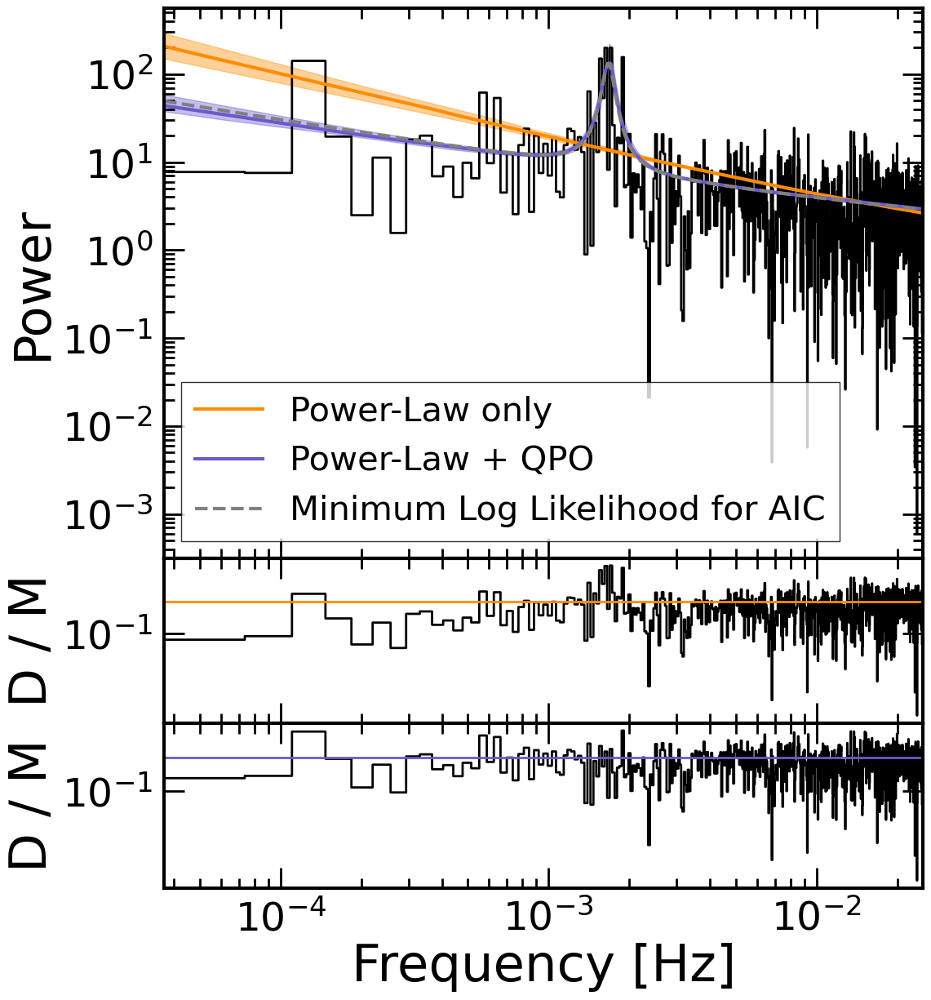

In [29]:
get_AIC_pl('0915390701', 2., 10., 20)

Delta AIC = 78.80
epsilon = 7.75e-18


(78.79877909330116, 7.745733125072882e-18)

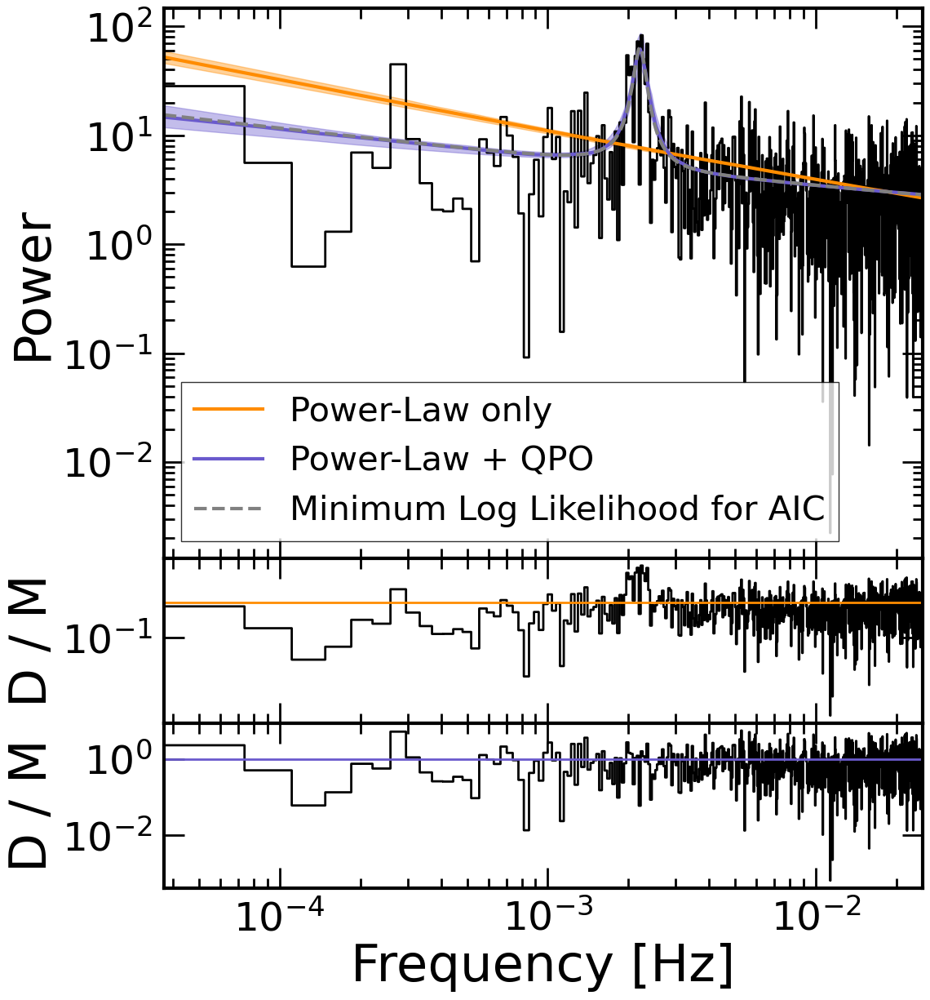

In [30]:
get_AIC_pl('0931791401', 2., 10., 20)

Delta AIC = 44.05
epsilon = 2.71e-10


(44.05454592303499, 2.714419092980522e-10)

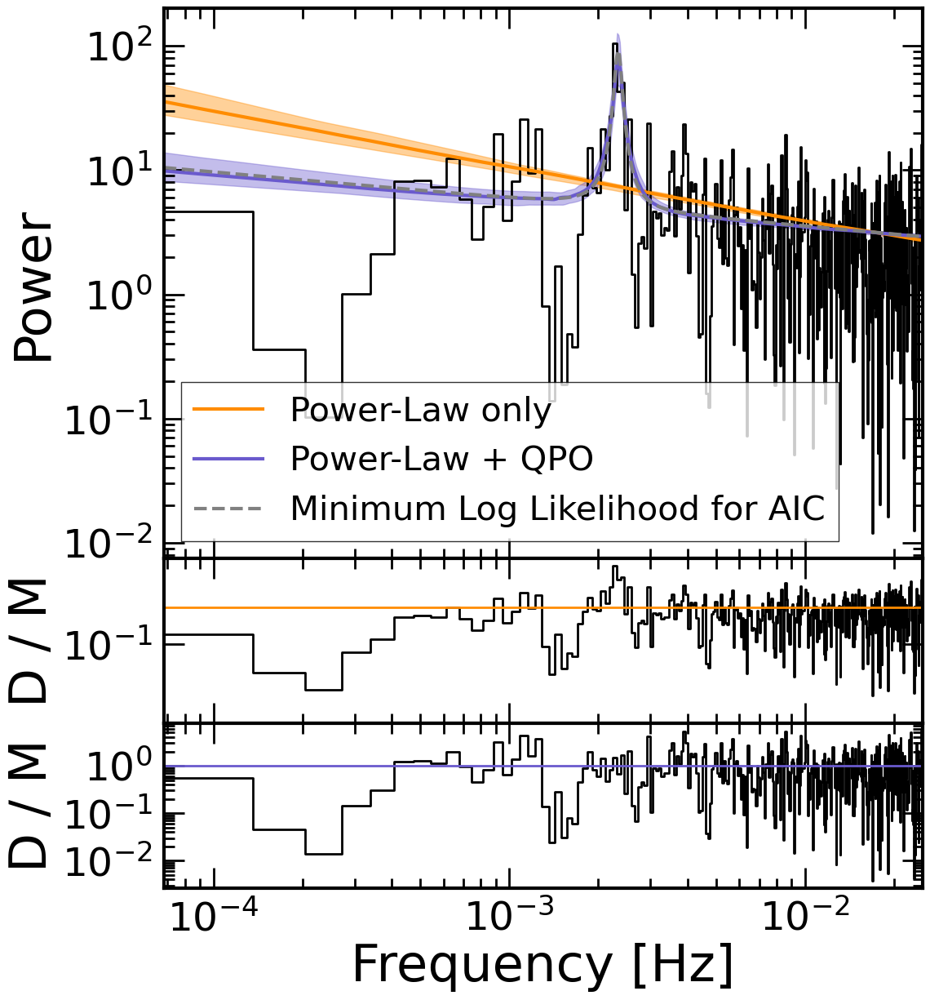

In [31]:
get_AIC_pl('0932392001', 2., 10., 20)

Delta AIC = 4.48
epsilon = 1.07e-01


(4.4751033476673, 0.1067194688538726)

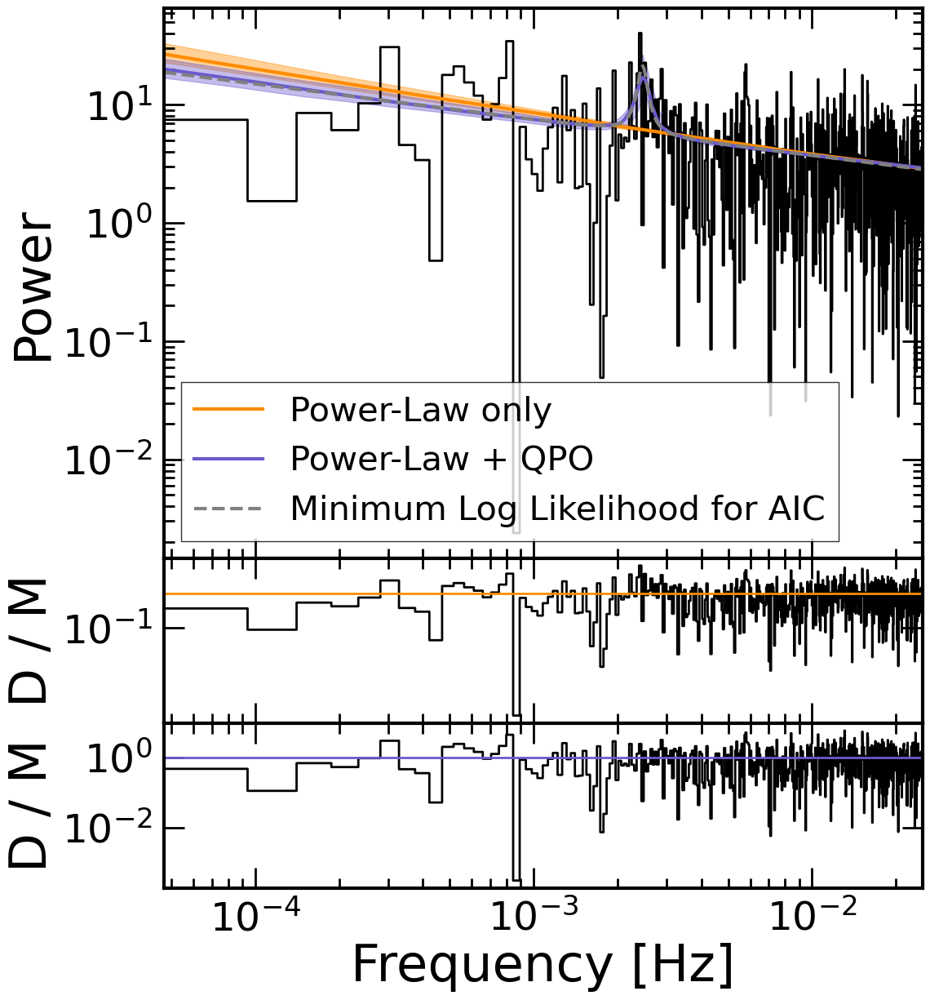

In [32]:
get_AIC_pl('0932392101', 2., 10., 20)

### Lorentzian Broadband Noise Model

In [34]:
def get_AIC_lor(obs, emin, emax, tbin, nburn=5000):

    # get data
    _, _, _, freq, power, _, _, f_min, f_max, _, _ = make_psd(obs, data_path, emin, emax, tbin, 0)

    # dimensions to be used in the computation of AIC
    k_lor = 3
    k_qpo_lor = 6
    n = len(freq)

    # load in the data from mcmc fits - without the QPO
    fname = mcmc_path_bb+'broadband_'+obs+'_'+str(emin)+'-'+str(emax)+'keV_mcmc_lorentzian.h5'
    backend = emcee.backends.HDFBackend(fname)
    if os.path.exists(fname):
        samples = backend.get_chain(discard=nburn, flat=True)
        negloglike_lor = min(-backend.get_log_prob(discard=nburn, flat=True))
    # grab the mcmc data to plot the MCMC model instead of the MLE
    n_rand = 100
    grid_mcmc = np.linspace(f_min, f_max, 1000)
    fit_bb = np.zeros((len(grid_mcmc),n_rand))
    fit_bb_binned = np.zeros((len(freq),n_rand))
    for i in range(n_rand):
        use_R_bb, use_D_bb, use_c = samples[i,:]
        fit_bb[:,i] = lorentzian(grid_mcmc, use_R_bb, use_D_bb, use_c)
        fit_bb_binned[:,i] = lorentzian(freq, use_R_bb, use_D_bb, use_c)
    med_bb_fit = np.median(fit_bb, axis=1)
    med_bb_fit_16 = np.percentile(fit_bb, 16, axis=1)
    med_bb_fit_84 = np.percentile(fit_bb, 84, axis=1)
    med_bb_fit_binned = np.median(fit_bb_binned, axis=1)

    # load in the data from mcmc fits - with the QPO
    fname = mcmc_path_qpo+'qpo_'+obs+'_'+str(emin)+'-'+str(emax)+'keV_mcmc_lorentzian.h5'
    backend = emcee.backends.HDFBackend(fname)
    if os.path.exists(fname):
        samples = backend.get_chain(discard=nburn, flat=True)
        negloglike_qpo_lor = min(-backend.get_log_prob(discard=nburn, flat=True))
        best_loc = np.argmin(-backend.get_log_prob(discard=nburn, flat=True))
    # grab the mcmc data to plot the MCMC model instead of the MLE
    fit = np.zeros((len(grid_mcmc),n_rand))
    fit_binned = np.zeros((len(freq),n_rand))
    for i in range(n_rand):
        use_R_bb, use_D_bb, use_c, use_nu0, use_R, use_D = samples[i,:]
        fit[:,i] = qpo_lor(grid_mcmc, use_R_bb, use_D_bb, use_c, use_nu0, use_R, use_D)
        fit_binned[:,i] = qpo_lor(freq, use_R_bb, use_D_bb, use_c, use_nu0, use_R, use_D)
    med_fit = np.median(fit, axis=1)
    med_fit_16 = np.percentile(fit, 16, axis=1)
    med_fit_84 = np.percentile(fit, 84, axis=1)
    med_fit_binned = np.median(fit_binned, axis=1)

    AIC_lor = 2 * k_lor + negloglike_lor + ((2 * k_lor * (k_lor + 1)) / (n - k_lor - 1))
    AIC_qpo_lor = 2 * k_qpo_lor + negloglike_qpo_lor + ((2 * k_qpo_lor * (k_qpo_lor + 1)) / (n - k_qpo_lor - 1))
    delta_AIC = AIC_lor - AIC_qpo_lor
    ep = np.exp(-delta_AIC / 2)
    print('''Delta AIC = {:.2f}
epsilon = {:.2e}'''.format(delta_AIC, ep))

    # quick plot
    fig, axs = plt.subplots(figsize=(12,14), nrows=3, sharex=True, gridspec_kw={'hspace':0, 'height_ratios':[1,0.3,0.3]})
    ax = axs[0]
    ax.step(freq, power, lw=2, color='k')
    grid = np.linspace(min(freq), max(freq), 1000)
    ax.plot(grid_mcmc, med_bb_fit, color='darkorange', lw=3, ls='-', label='Lorentzian only')
    ax.fill_between(grid_mcmc, med_bb_fit_16, med_bb_fit_84, color='darkorange', alpha=0.4)
    ax.plot(grid_mcmc, med_fit, color='slateblue', lw=3, ls='-', label='Lorentzian + QPO')
    ax.fill_between(grid_mcmc, med_fit_16, med_fit_84, color='slateblue', alpha=0.4)
    ax.plot(grid, qpo_lor(grid, *samples[best_loc]), 'grey', lw=3, ls='--', label='Minimum Log Likelihood for AIC')
    ax.set_ylabel('Power')
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.legend(loc='lower left')
    ax = axs[1]
    ax.step(freq, power / med_bb_fit_binned, lw=2, color='k')
    ax.axhline(1, color='darkorange')
    ax.set_ylabel('D / M')
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax = axs[2]
    ax.step(freq, power / med_fit_binned, lw=2, color='k')
    ax.axhline(1, color='slateblue')
    ax.set_xlabel('Frequency [Hz]')
    ax.set_ylabel('D / M')
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.set_xlim(min(freq), max(freq))

    return delta_AIC, ep

#### 2-10 keV, all obs with a QPO

YOU HAVE A SERIOUS PROBLEM. YOUR DATA IS NOT CONTINUOUS. YOU ARE LINEARLY INTERPOLATING THE GAPS. MAKE SURE THAT THESE ARE NOT TOO LONG.
Delta AIC = 51.63
epsilon = 6.14e-12


(51.63201784117746, 6.141151070412451e-12)

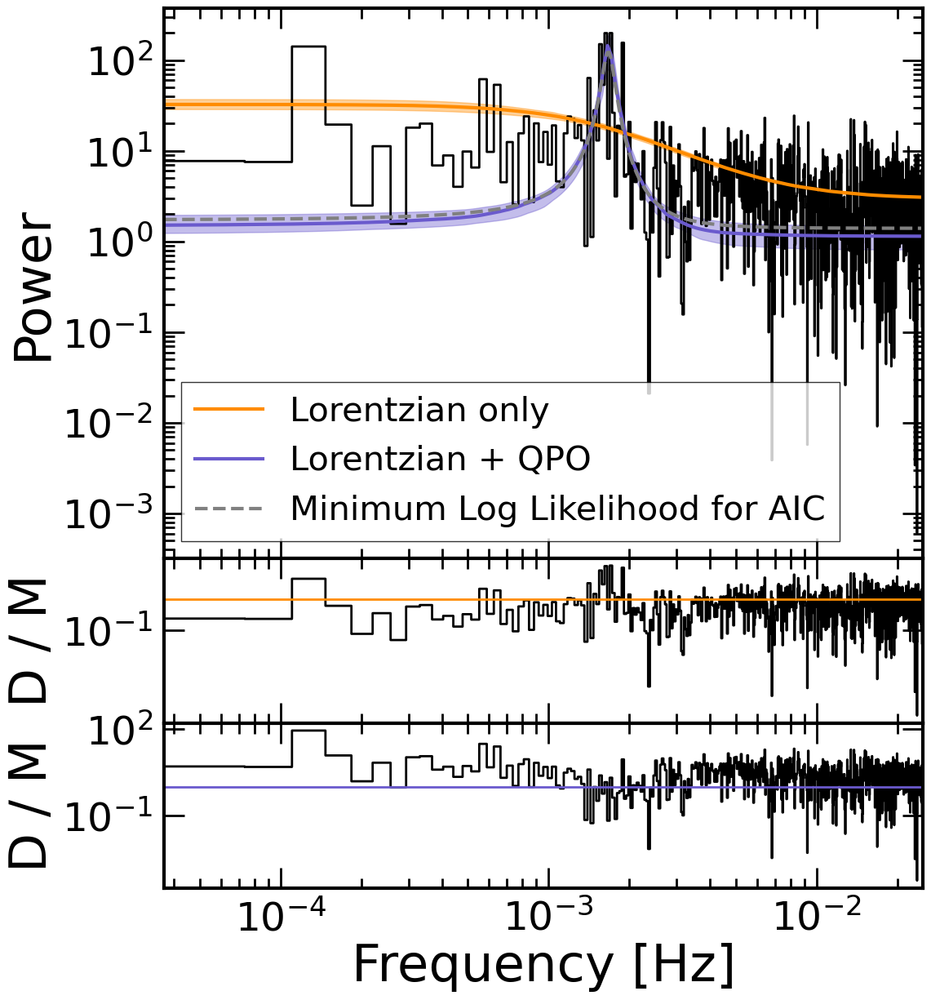

In [35]:
get_AIC_lor('0915390701', 2., 10., 20)

Delta AIC = 50.27
epsilon = 1.21e-11


(50.27444331624474, 1.2107189598080064e-11)

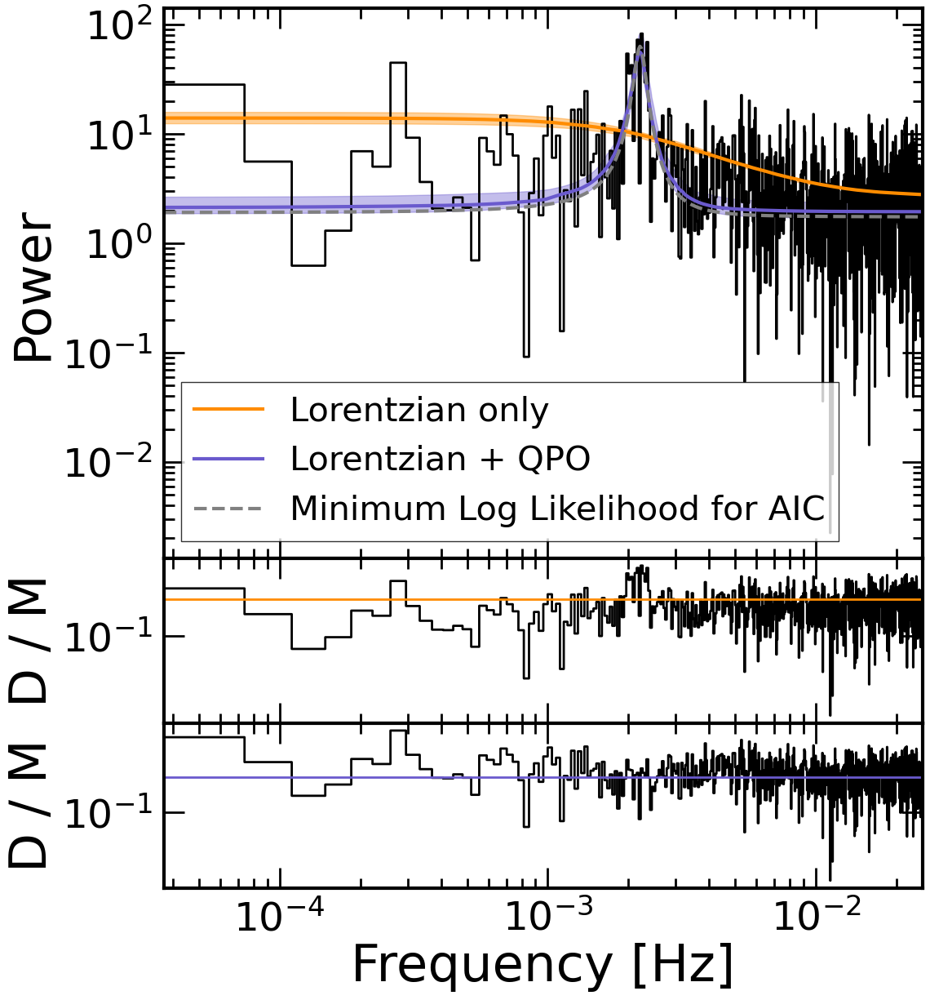

In [36]:
get_AIC_lor('0931791401', 2., 10., 20)

Delta AIC = 26.31
epsilon = 1.94e-06


(26.30914549810518, 1.936607650972474e-06)

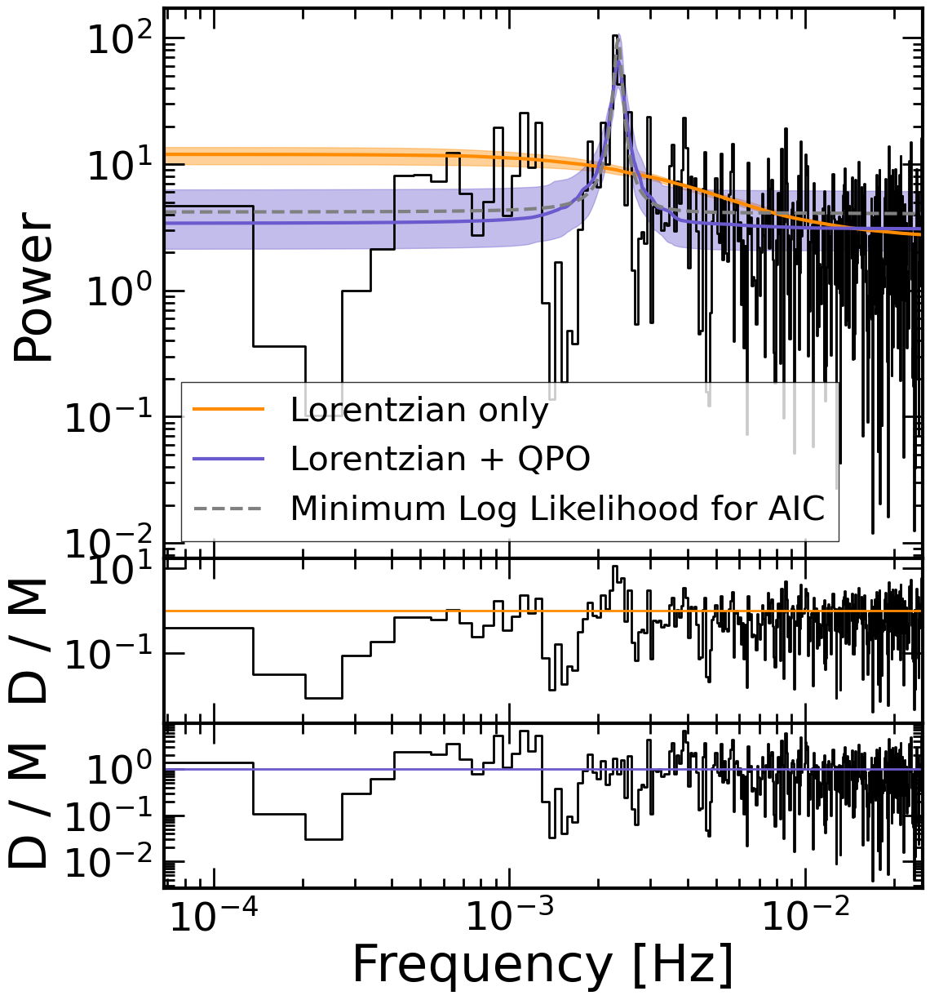

In [37]:
get_AIC_lor('0932392001', 2., 10., 20)

Delta AIC = 5.37
epsilon = 6.82e-02


(5.369352046404401, 0.06824329966095898)

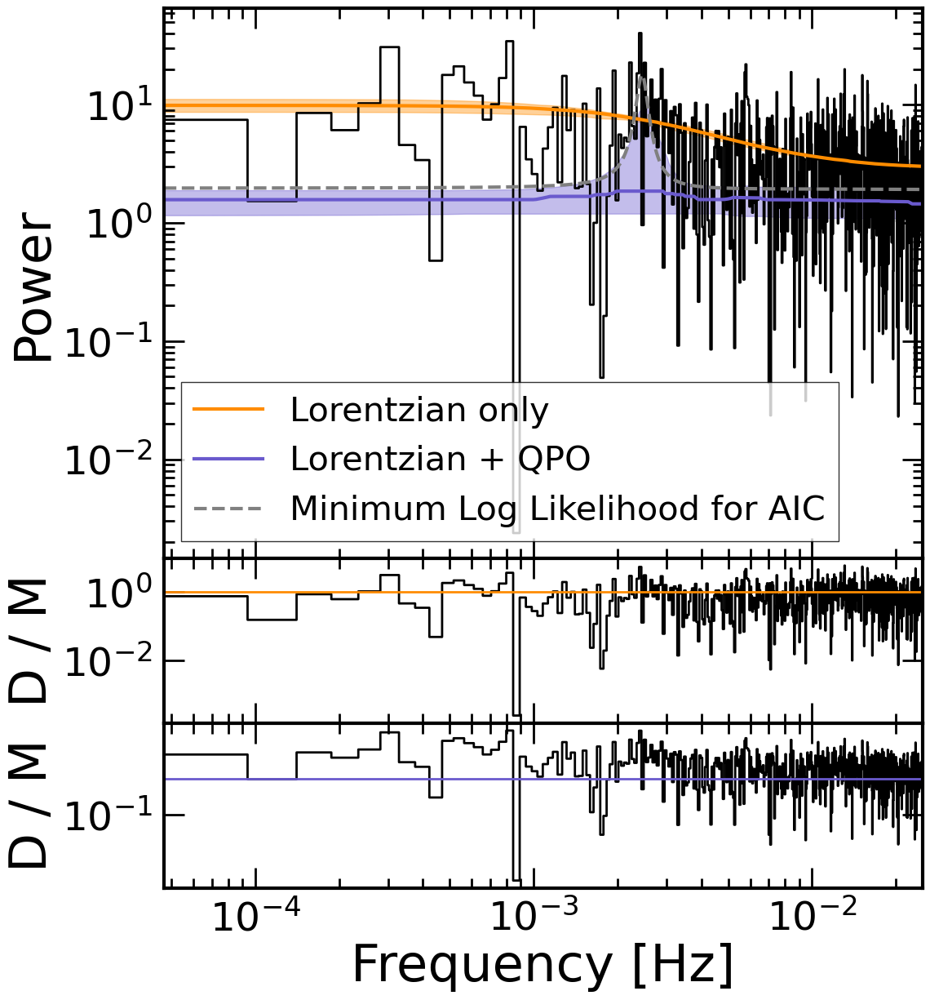

In [38]:
get_AIC_lor('0932392101', 2., 10., 20)

## Multiple observations, simultaneously fit (i.e. July-August 2022 data)

This repeats all of the same steps as above, i.e. fitting the data with an additional Lorentzian to model the QPO, then computing the AIC, $\Delta$ AIC, and resulting $\epsilon$ by comparing it to the broadband only model, just for simultaneous fits to numerous observations at once. 

In [40]:
def log_likelihood_multi(theta, fs, ys, model):
    """
    total log likelihood over multiple datasets.

    :param theta: Model parameters.
    :param fs: List of arrays, each containing frequency values for a dataset.
    :param ys: List of arrays, each containing power values for a dataset.
    :param model: The model to use ('powerlaw', 'broken_powerlaw', or 'lorentzian').
    :return: Total log likelihood summed over all datasets.
    """
    total_log_likelihood = 0.0
    for f, y in zip(fs, ys):
        if model == 'powerlaw':
            N0, b, c = theta
            model_y = powerlaw(f, N0, b, c)
        elif model == 'lorentzian':
            R, delta, c = theta
            model_y = lorentzian(f, R, delta, c)
        elif model == 'qpo_pl':
            N0, b, c, v0, R, delta = theta
            model_y = qpo_pl(f, N0, b, c, v0, R, delta)
        elif model == 'qpo_lor':
            R_bb, delta_bb, c, v0, R, delta = theta
            model_y = qpo_lor(f, R_bb, delta_bb, c, v0, R, delta)
        total_log_likelihood += np.sum((y / model_y) + np.log(model_y))
    return total_log_likelihood  # note that this is really the negative log likelihood (i.e. maximize this fn for MLE)

def log_probability_multi(theta, fs, ys, model):
    lp = log_prior(theta, model)
    if not np.isfinite(lp):
        return -np.inf
    return lp - log_likelihood_multi(theta, fs, ys, model)

### Power-Law Broadband Noise Model

In [43]:
def fit_qpo_multi_pl(name, obs, data_path, emin, emax, tbin=20, n=0, nwalkers=32, nsteps=5500, nburn=500, start_freq=None):

    # n is only used to plot! fits are done with n = 0

    # first grab the data and create lists of frequencies and powers
    # still need the unbinned data for fitting
    freq = []
    power = []
    f_min = []
    f_max = []
    for i,obsid in enumerate(obs):
        _, _, _, freq_tmp, power_tmp, _, _, f_min_tmp, f_max_tmp, _, _ = make_psd(obsid, data_path, emin, emax, tbin, n=0)
        freq.append(freq_tmp)
        power.append(power_tmp)
        f_min.append(f_min_tmp)
        f_max.append(f_max_tmp)
    
    _, _, _, freq_binned, power_binned, freq_binned_err, power_binned_err, _, _, _, _ = make_psd(obs, data_path, emin, emax, tbin, n)
    min_f = freq_binned[0] - freq_binned_err[0]
    max_f = freq_binned[-1] + freq_binned_err[-1] 

    ndim_pl = 3
    ndim_qpo_pl = 6
    initial_guess_pl = [1e-5, 0.5, 2]
    result_pl = opt.minimize(log_likelihood_multi, initial_guess_pl, args=(freq, power, 'powerlaw'),
                                bounds=((0,100),(0,5),(1e-6,100)))
    maxlike_pl = result_pl.x
    peak_freq = freq_binned[np.argmax(power_binned / powerlaw(freq_binned, *maxlike_pl))]

    if start_freq is None:
        initial_guess_qpo_pl = np.concatenate([maxlike_pl, [peak_freq, 0.2, 1e-5]])
    else:
        initial_guess_qpo_pl = np.concatenate([maxlike_pl, [start_freq, 0.2, 1e-5]])
    p0 = initial_guess_qpo_pl * (1 + 1e-3 * np.random.randn(nwalkers, ndim_qpo_pl))

    # name of the mcmc to load in or save
    fname = mcmc_path_qpo+'qpo_'+name+'_'+str(emin)+'-'+str(emax)+'keV_mcmc_powerlaw.h5'
    backend = emcee.backends.HDFBackend(fname)

    # if we have run the MCMC, load it in
    if os.path.exists(fname):
        samples = backend.get_chain(discard=nburn, flat=True)
    # if we haven't run the MCMC yet, run it
    else:
        backend.reset(nwalkers, ndim_qpo_pl)
        sampler = emcee.EnsembleSampler(nwalkers, ndim_qpo_pl, log_probability_multi, args=(freq, power, 'qpo_pl'), backend=backend)
        sampler.run_mcmc(p0, nsteps, progress=True)
        samples = sampler.get_chain(discard=nburn, flat=True)

    lab = [r"$N_0$", r"$\alpha$", r"$c$", r"$\nu_0$", r"$a_0$", r"$\Delta$"]
    fig = corner.corner(samples, labels=lab, figsize=(18,18), labelpad=1)

    n_rand = 100
    grid = np.linspace(min_f, max_f, 1000)
    fit = np.zeros((len(grid),n_rand))
    # fit_binned = np.zeros((len(freq),n_rand))
    for i in range(n_rand):
        use_N0, use_alpha, use_c, use_nu0, use_R, use_D = samples[i,:]
        fit[:,i] = qpo_pl(grid, use_N0, use_alpha, use_c, use_nu0, use_R, use_D)
    med_fit = np.median(fit, axis=1)

    # compute important parameters like frequency, Q, rms
    best_fit_params = np.median(samples, axis=0)
    best_delta = best_fit_params[5]

    # quality factor
    Q = samples[:,3] / (2 * samples[:,5])
    Q_med = np.median(Q)
    Q_16 = np.percentile(Q, 16)
    Q_84 = np.percentile(Q, 84)
    Q_err = np.array([Q_med - Q_16, Q_84 - Q_med])
    Q_err_avg = np.mean(Q_err)

    # qpo frequency
    qpo_freq = best_fit_params[3]  
    qpo_freq_std = np.std(samples[:,3])
    qpo_freq_16 = np.percentile(samples[:,3], 16)
    qpo_freq_84 = np.percentile(samples[:,3], 84)

    # rms, from normalization of the Lorentzian
    rms = np.median(samples[:,4])
    rms_std = np.std(samples[:,4])
    rms_16 = np.percentile(samples[:,4], 16)
    rms_84 = np.percentile(samples[:,4], 84)

    # characteristic frequency, see Ingram+19 pg. 7
    char_freq_med = np.median(np.sqrt(samples[:,3]**2 + samples[:,5]**2))
    char_freq_16 = np.percentile(np.sqrt(samples[:,3]**2 + samples[:,5]**2), 16)
    char_freq_84 = np.percentile(np.sqrt(samples[:,3]**2 + samples[:,5]**2), 84)
    char_freq_std = np.std(np.sqrt(samples[:,3]**2 + samples[:,5]**2))

    fig, axs = plt.subplots(figsize=(20,14), nrows=2, gridspec_kw={'hspace':0, 'height_ratios':[1,0.3]})
    ax = axs[0]
    ax.errorbar(freq_binned, power_binned, xerr=freq_binned_err, yerr=power_binned_err, fmt='o', ms=0, color='k', lw=2)
    ax.plot(grid, med_fit, color='slateblue', lw=5, ls='--', label='Power-Law + Lorentzian (MCMC Median)')
    ax.plot(grid, lorentzian_noconst(grid, qpo_freq, rms, best_delta), color='darkorange', lw=5, ls='--', 
            label=r'$Q$ = {:.1f} $\pm$ {:.1f}, $\nu_0$ = {:.3f} $\pm$ {:.3f} mHz'.format(Q_med, Q_err_avg, qpo_freq / 1e-3, qpo_freq_std / 1e-3))
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_ylabel('Periodogram')
    ax.set_xlim(min_f, max_f)
    ax.set_ylim(8e-2,3e2)
    ax.legend(loc='lower left')
    ax = axs[1]
    ax.axhline(1, color='slateblue', ls='--', lw=5)
    ax.errorbar(freq_binned, power_binned / qpo_pl(freq_binned, *best_fit_params), 
                xerr=freq_binned_err, yerr=power_binned_err / qpo_pl(freq_binned, *best_fit_params), 
                fmt='o', ms=0, color='k', lw=2)
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_ylabel('D / M')
    ax.set_xlabel('Frequency [Hz]')
    ax.set_xlim(min_f, max_f)
    ax.set_ylim(3e-2,2e1)

    fig, axs = plt.subplots(figsize=(60,14), nrows=2, ncols=len(obs), gridspec_kw={'hspace':0, 'height_ratios':[1,0.3]})
    for i in range(len(obs)):
        ax = axs[0,i]
        ax.step(freq[i], power[i], color='k', lw=2, where='mid')
        ax.plot(grid, med_fit, color='slateblue', lw=5, ls='--', label='Power-Law + Lorentzian (MCMC Median)')
        ax.plot(grid, lorentzian_noconst(grid, qpo_freq, rms, best_delta), color='darkorange', lw=5, ls='--', 
                label=r'$Q$ = {:.1f} $\pm$ {:.1f}, $\nu_0$ = {:.3f} $\pm$ {:.3f} mHz'.format(Q_med, Q_err_avg, qpo_freq / 1e-3, qpo_freq_std / 1e-3))
        ax.set_xscale('log')
        ax.set_yscale('log')
        if i == 0:
            ax.set_ylabel('Periodogram')
        ax.set_xlim(min_f, max_f)
        ax.set_ylim(8e-2,3e2)
        if i == 0:
            ax.legend(loc='lower left')
        ax = axs[1,i]
        ax.axhline(1, color='slateblue', ls='--', lw=5)
        ax.step(freq[i], power[i] / qpo_pl(freq[i], *best_fit_params), color='k', lw=2, where='mid')
        ax.set_xscale('log')
        ax.set_yscale('log')
        if i == 0:
            ax.set_ylabel('D / M')
        ax.set_xlabel('Frequency [Hz]')
        ax.set_xlim(min_f, max_f)
        ax.set_ylim(3e-2,2e1)

    return qpo_freq, qpo_freq_std, qpo_freq_16, qpo_freq_84, Q_med, Q_err_avg, Q_16, Q_84, rms, rms_std, rms_16, rms_84, char_freq_med, char_freq_std, char_freq_16, char_freq_84

100%|██████████| 55000/55000 [09:58<00:00, 91.92it/s] 


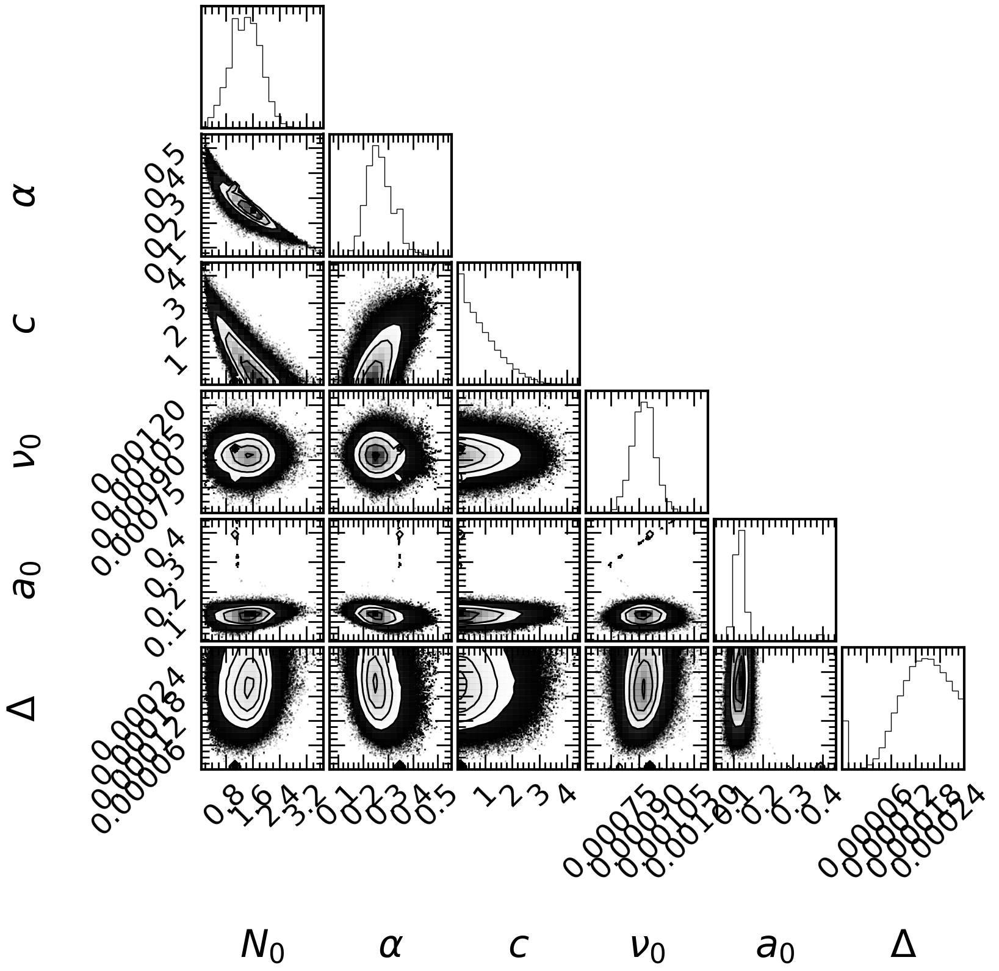

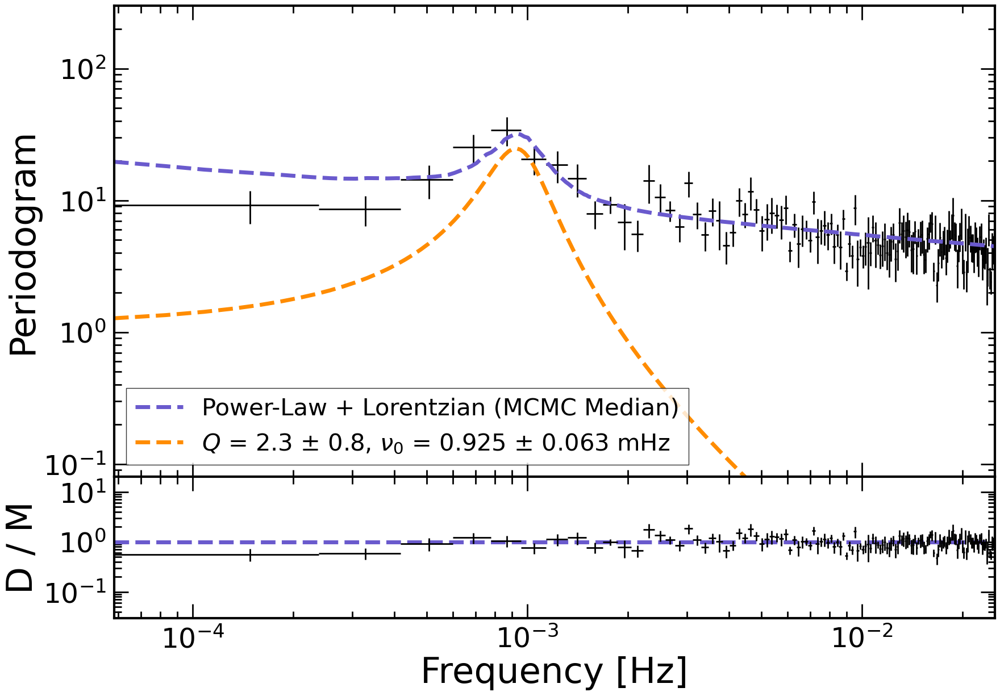

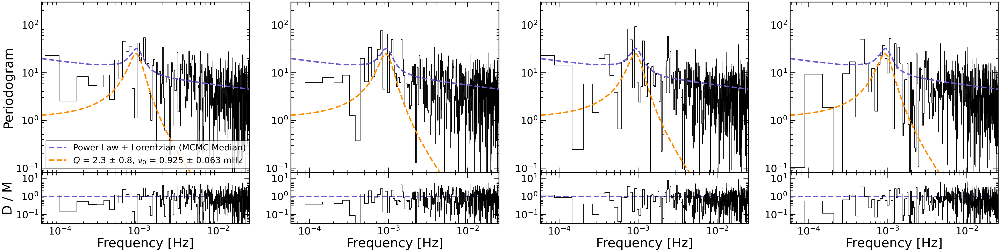

In [44]:
use_obs = np.array(['0902590201', '0902590301', '0902590401', '0902590501'])
name = 'Aug2022'
emin = 2.
emax = 10.
tbin = 20
n = 0

# set up arrays to save data into 
qpo_freq = np.zeros(3)
Q = np.zeros(3)
rms = np.zeros(3)
char_freq = np.zeros(3)

qpo_freq_med, qpo_freq_std, qpo_freq_16, qpo_freq_84, Q_med, Q_err_avg, Q_16, Q_84, rms_med, rms_std, rms_16, rms_84, char_freq_med, char_freq_std, char_freq_16, char_freq_84= \
fit_qpo_multi_pl(name, use_obs, data_path, emin, emax, tbin=tbin, n=12, nsteps=55000, nburn=5000)

# save qpo frequency
qpo_freq[0] = qpo_freq_med
qpo_freq[1] = qpo_freq_med - qpo_freq_16
qpo_freq[2] = qpo_freq_84 - qpo_freq_med

# save Q
Q[0] = Q_med
Q[1] = Q_med - Q_16
Q[2] = Q_84 - Q_med

# save rms
rms[0] = rms_med
rms[1] = rms_med - rms_16
rms[2] = rms_84 - rms_med

# same characteristic frequency
char_freq[0] = char_freq_med
char_freq[1] = char_freq_med - char_freq_16
char_freq[2] = char_freq_84 - char_freq_med

In [45]:
emin = 2.
emax = 10.
print('ObsID: ', use_obs)
print('------------------')
print('QPO Frequency: {:.3f} - {:.3f} + {:.3f} mHz'.format(qpo_freq[0] / 1e-3, qpo_freq[1] / 1e-3, qpo_freq[2] / 1e-3))
print('QPO Q Factor: {:.1f} - {:.1f} + {:.1f}'.format(Q[0], Q[1], Q[2]))
print('QPO RMS: {:.1f} - {:.1f} + {:.1f} %'.format(rms[0] * 100, rms[1] * 100, rms[2] * 100))
print('Characteristic Frequency: {:.3f} - {:.3f} + {:.3f} mHz'.format(char_freq[0] / 1e-3, char_freq[1] / 1e-3, char_freq[2] / 1e-3))
print('------------------------------------------------------------------')

ObsID:  ['0902590201' '0902590301' '0902590401' '0902590501']
------------------
QPO Frequency: 0.925 - 0.062 + 0.059 mHz
QPO Q Factor: 2.3 - 0.5 + 1.0
QPO RMS: 12.1 - 1.5 + 1.7 %
Characteristic Frequency: 0.948 - 0.062 + 0.061 mHz
------------------------------------------------------------------


In [50]:
def get_AIC_multi_pl(name, obs, emin, emax, tbin, nburn=5000):

    # first grab the data and create lists of frequencies and powers
    # still need the unbinned data for fitting, even if n > 0
    freq = []
    power = []
    f_min = []
    f_max = []
    n = 0
    for i,obsid in enumerate(obs):
        _, _, _, freq_tmp, power_tmp, _, _, f_min_tmp, f_max_tmp, _, _ = make_psd(obsid, data_path, emin, emax, tbin, n=0)
        freq.append(freq_tmp)
        power.append(power_tmp)
        f_min.append(f_min_tmp)
        f_max.append(f_max_tmp)
        n = n + len(freq_tmp)
    
    _, _, _, freq_binned, power_binned, freq_binned_err, power_binned_err, _, _, _, _ = make_psd(obs, data_path, emin, emax, tbin, n=12)
    min_f = freq_binned[0] - freq_binned_err[0]
    max_f = freq_binned[-1] + freq_binned_err[-1] 

    k_pl = 3
    k_qpo_pl = 6

    # load in the data from mcmc fits
    fname = mcmc_path_bb+'broadband_'+name+'_'+str(emin)+'-'+str(emax)+'keV_mcmc_powerlaw.h5'
    backend = emcee.backends.HDFBackend(fname)
    if os.path.exists(fname):
        # samples = backend.get_chain(discard=nburn, flat=True)
        negloglike_pl = min(-backend.get_log_prob(discard=nburn, flat=True))
    fname = mcmc_path_qpo+'qpo_'+name+'_'+str(emin)+'-'+str(emax)+'keV_mcmc_powerlaw.h5'
    backend = emcee.backends.HDFBackend(fname)
    if os.path.exists(fname):
        # samples = backend.get_chain(discard=nburn, flat=True)
        negloglike_qpo_pl = min(-backend.get_log_prob(discard=nburn, flat=True))

    AIC_pl = 2 * k_pl + negloglike_pl + ((2 * k_pl * (k_pl + 1)) / (n - k_pl - 1))
    AIC_qpo_pl = 2 * k_qpo_pl + negloglike_qpo_pl + ((2 * k_qpo_pl * (k_qpo_pl + 1)) / (n - k_qpo_pl - 1))
    delta_AIC = AIC_pl - AIC_qpo_pl
    ep = np.exp(-delta_AIC / 2)
    print('''Delta AIC = {:.2f}
epsilon = {:.2e}'''.format(delta_AIC, ep))

    return delta_AIC, ep

In [51]:
get_AIC_multi_pl(name, use_obs, 2., 10., 20)

Delta AIC = 11.49
epsilon = 3.20e-03


(11.490615530601644, 0.0031977502436172332)

### Lorentzian Broadband Noise Model

In [54]:
def fit_qpo_multi_lor(name, obs, data_path, emin, emax, tbin=20, n=0, nwalkers=32, nsteps=5500, nburn=500, start_freq=None):

    # n is only used for plotting - fits are done with n = 0

    # first grab the data and create lists of frequencies and powers
    # still need the unbinned data for fitting, even if n > 0
    freq = []
    power = []
    f_min = []
    f_max = []
    for i,obsid in enumerate(obs):
        _, _, _, freq_tmp, power_tmp, _, _, f_min_tmp, f_max_tmp, _, _ = make_psd(obsid, data_path, emin, emax, tbin, n=0)
        freq.append(freq_tmp)
        power.append(power_tmp)
        f_min.append(f_min_tmp)
        f_max.append(f_max_tmp)
    
    _, _, _, freq_binned, power_binned, freq_binned_err, power_binned_err, _, _, _, _ = make_psd(obs, data_path, emin, emax, tbin, n)
    min_f = freq_binned[0] - freq_binned_err[0]
    max_f = freq_binned[-1] + freq_binned_err[-1] 

    ndim_lor = 3
    ndim_qpo_lor = 6
    initial_guess_lor = [2, 0.2, 2]
    result_lor = opt.minimize(log_likelihood_multi, initial_guess_lor, args=(freq, power, 'lorentzian'),
                                bounds=((1e-4,1e2),(1e-5,1e2),(1e-6,100)))
    maxlike_lor = result_lor.x
    peak_freq = freq_binned[np.argmax(power_binned / lorentzian(freq_binned, *maxlike_lor))]

    if start_freq is None:
        initial_guess_qpo_lor = np.concatenate([maxlike_lor, [peak_freq, 0.2, 1e-5]])
    else:
        print(maxlike_lor)
        # initial_guess_qpo_lor = np.concatenate([[1e-2, maxlike_lor[1], maxlike_lor[2]], [start_freq, 0.15, 3e-4]])
        initial_guess_qpo_lor = np.concatenate([maxlike_lor, [start_freq, 0.15, 3e-4]])
    p0 = initial_guess_qpo_lor * (1 + 1e-3 * np.random.randn(nwalkers, ndim_qpo_lor))

    # name of the mcmc to load in or save
    fname = mcmc_path_qpo+'qpo_'+name+'_'+str(emin)+'-'+str(emax)+'keV_mcmc_lorentzian.h5'
    backend = emcee.backends.HDFBackend(fname)

    # if we have run the MCMC, load it in
    if os.path.exists(fname):
        samples = backend.get_chain(discard=nburn, flat=True)
        best_loc = np.argmin(-backend.get_log_prob(discard=nburn, flat=True))
    # if we haven't run the MCMC yet, run it
    else:
        backend.reset(nwalkers, ndim_qpo_lor)
        sampler = emcee.EnsembleSampler(nwalkers, ndim_qpo_lor, log_probability_multi, args=(freq, power, 'qpo_lor'), backend=backend)
        sampler.run_mcmc(p0, nsteps, progress=True)
        samples = sampler.get_chain(discard=nburn, flat=True)
        best_loc = np.argmin(-backend.get_log_prob(discard=nburn, flat=True))

    lab = [r"$a_{0,\mathrm{bb}}$", r"$\Delta_{\mathrm{bb}}$", r"$c$", r"$\nu_0$", r"$a_0$", r"$\Delta$"]
    fig = corner.corner(samples, labels=lab, figsize=(18,18), labelpad=1)

    n_rand = 100
    grid = np.linspace(min_f, max_f, 1000)
    fit = np.zeros((len(grid),n_rand))
    # fit_binned = np.zeros((len(freq),n_rand))
    for i in range(n_rand):
        use_R_bb, use_D_bb, use_c, use_nu0, use_R, use_D = samples[i,:]
        fit[:,i] = qpo_lor(grid, use_R_bb, use_D_bb, use_c, use_nu0, use_R, use_D)
        # fit_binned[:,i] = qpo_lor(freq, use_R_bb, use_D_bb, use_c, use_nu0, use_R, use_D)
    med_fit = np.median(fit, axis=1)
    med_fit_16 = np.percentile(fit, 16, axis=1)
    med_fit_84 = np.percentile(fit, 84, axis=1)
    # med_fit_binned = np.median(fit_binned, axis=1)

    # compute important parameters like frequency, Q, rms
    best_fit_params = np.median(samples, axis=0)
    best_delta = best_fit_params[5]

    # quality factor
    Q = samples[:,3] / (2 * samples[:,5])
    Q_med = np.median(Q)
    Q_16 = np.percentile(Q, 16)
    Q_84 = np.percentile(Q, 84)
    Q_err = np.array([Q_med - Q_16, Q_84 - Q_med])
    Q_err_avg = np.mean(Q_err)

    # qpo frequency
    qpo_freq = best_fit_params[3]  
    qpo_freq_std = np.std(samples[:,3])
    qpo_freq_16 = np.percentile(samples[:,3], 16)
    qpo_freq_84 = np.percentile(samples[:,3], 84)

    # rms, from normalization of the Lorentzian
    rms = np.median(samples[:,4])
    rms_std = np.std(samples[:,4])
    rms_16 = np.percentile(samples[:,4], 16)
    rms_84 = np.percentile(samples[:,4], 84)

    # characteristic frequency, see Ingram+19 pg. 7
    char_freq_med = np.median(np.sqrt(samples[:,3]**2 + samples[:,5]**2))
    char_freq_16 = np.percentile(np.sqrt(samples[:,3]**2 + samples[:,5]**2), 16)
    char_freq_84 = np.percentile(np.sqrt(samples[:,3]**2 + samples[:,5]**2), 84)
    char_freq_std = np.std(np.sqrt(samples[:,3]**2 + samples[:,5]**2))

    fig, axs = plt.subplots(figsize=(20,14), nrows=2, gridspec_kw={'hspace':0, 'height_ratios':[1,0.3]})
    ax = axs[0]
    ax.errorbar(freq_binned, power_binned, xerr=freq_binned_err, yerr=power_binned_err, fmt='o', ms=0, color='k', lw=2)
    ax.plot(grid, med_fit, color='slateblue', lw=5, ls='--', label='Lorentzian + Lorentzian (MCMC Median)')
    ax.fill_between(grid, med_fit_16, med_fit_84, color='slateblue', alpha=0.3)
    ax.plot(grid, qpo_lor(grid,*samples[best_loc]), color='grey', lw=5, ls='--', label='Minimium Log Likelihood for AIC')
    ax.plot(grid, lorentzian_noconst(grid, qpo_freq, rms, best_delta), color='darkorange', lw=5, ls='--', 
            label=r'$Q$ = {:.1f} $\pm$ {:.1f}, $\nu_0$ = {:.3f} $\pm$ {:.3f} mHz'.format(Q_med, Q_err_avg, qpo_freq / 1e-3, qpo_freq_std / 1e-3))
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_ylabel('Periodogram')
    ax.set_xlim(min_f, max_f)
    ax.set_ylim(8e-2,3e2)
    ax.legend(loc='lower left')
    ax = axs[1]
    ax.axhline(1, color='slateblue', ls='--', lw=5)
    ax.errorbar(freq_binned, power_binned / qpo_lor(freq_binned, *best_fit_params), 
                xerr=freq_binned_err, yerr=power_binned_err / qpo_lor(freq_binned, *best_fit_params), 
                fmt='o', ms=0, color='k', lw=2)
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_ylabel('D / M')
    ax.set_xlabel('Frequency [Hz]')
    ax.set_xlim(min_f, max_f)
    ax.set_ylim(3e-2,2e1)

    # grab fit parameters for the broadband fit too
    fname = mcmc_path_bb+'broadband_'+name+'_'+str(emin)+'-'+str(emax)+'keV_mcmc_lorentzian.h5'
    backend = emcee.backends.HDFBackend(fname)
    # if we have run the MCMC, load it in
    if os.path.exists(fname):
        samples_bb = backend.get_chain(discard=nburn, flat=True)
    # if we haven't run the MCMC yet, run it
    else:
        raise FileNotFoundError
    # find the median fit
    n_rand = 100
    fit_bb = np.zeros((len(grid),n_rand))
    for i in range(n_rand):
        use_R, use_delta, use_c = samples_bb[i,:]
        fit_bb[:,i] = lorentzian(grid, use_R, use_delta, use_c)
    med_fit_bb = np.median(fit_bb, axis=1)
    # axs[0].plot(grid, med_fit_bb, color='dodgerblue', lw=5, ls='--', label='Lorentzian Only (MCMC Median)')

    fig, axs = plt.subplots(figsize=(60,14), nrows=2, ncols=len(obs), gridspec_kw={'hspace':0, 'height_ratios':[1,0.3]})
    for i in range(len(obs)):
        ax = axs[0,i]
        ax.step(freq[i], power[i], color='k', lw=2, where='mid')
        ax.plot(grid, med_fit, color='slateblue', lw=5, ls='--', label='Lorentzian + Lorentzian (MCMC Median)')
        # ax.plot(grid, med_fit_bb, color='dodgerblue', lw=5, ls='--', label='Lorentzian Only (MCMC Median)')
        # ax.plot(grid, qpo_lor(grid,*initial_guess_qpo_lor), color='mediumseagreen', lw=5, ls='--', label='Lorentzian + Lorentzian (Initialization)')
        ax.plot(grid, lorentzian_noconst(grid, qpo_freq, rms, best_delta), color='darkorange', lw=5, ls='--', 
                label=r'$Q$ = {:.1f} $\pm$ {:.1f}, $\nu_0$ = {:.3f} $\pm$ {:.3f} mHz'.format(Q_med, Q_err_avg, qpo_freq / 1e-3, qpo_freq_std / 1e-3))
        ax.set_xscale('log')
        ax.set_yscale('log')
        if i == 0:
            ax.set_ylabel('Periodogram')
        ax.set_xlim(min_f, max_f)
        ax.set_ylim(8e-2,3e2)
        if i == 0:
            ax.legend(loc='lower left')
        ax = axs[1,i]
        ax.axhline(1, color='slateblue', ls='--', lw=5)
        ax.step(freq[i], power[i] / qpo_lor(freq[i], *best_fit_params), color='k', lw=2, where='mid')
        ax.set_xscale('log')
        ax.set_yscale('log')
        if i == 0:
            ax.set_ylabel('D / M')
        ax.set_xlabel('Frequency [Hz]')
        ax.set_xlim(min_f, max_f)
        ax.set_ylim(3e-2,2e1)

    return qpo_freq, qpo_freq_std, qpo_freq_16, qpo_freq_84, Q_med, Q_err_avg, Q_16, Q_84, rms, rms_std, rms_16, rms_84, char_freq_med, char_freq_std, char_freq_16, char_freq_84

[2.16528929e-01 2.37636419e-03 4.47644509e+00]


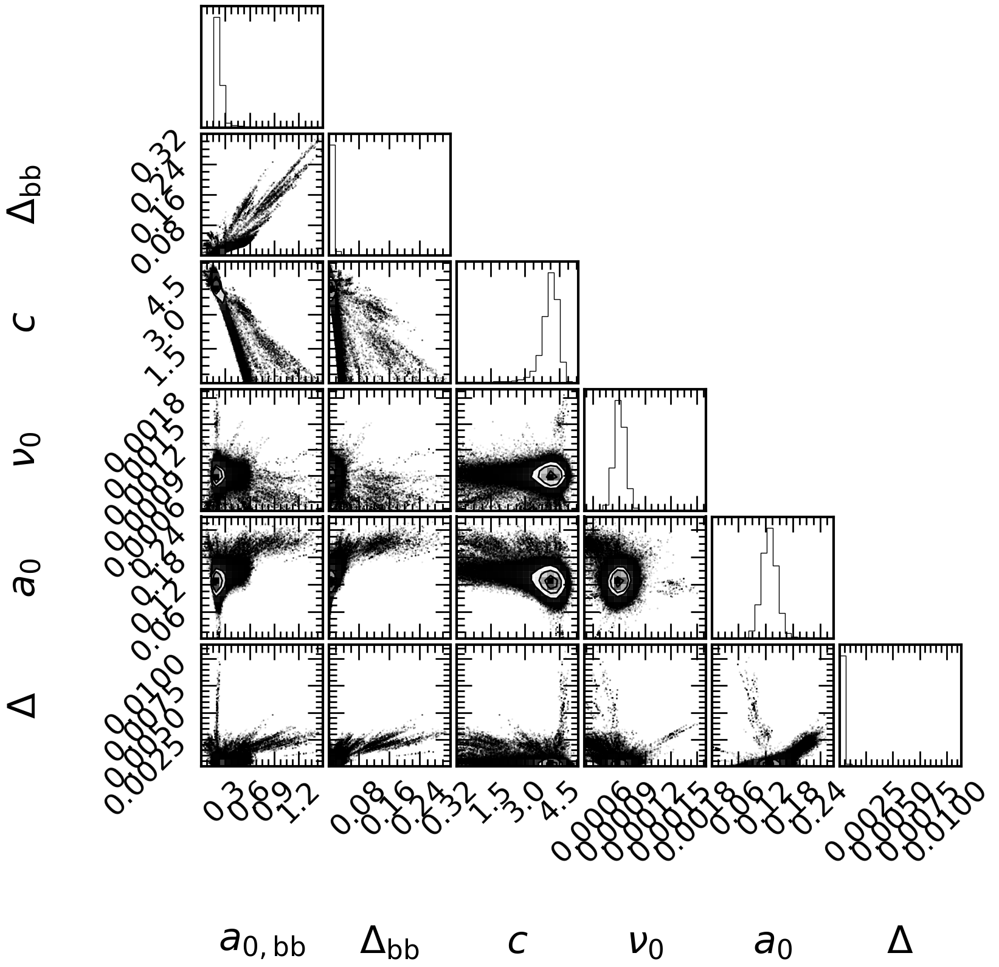

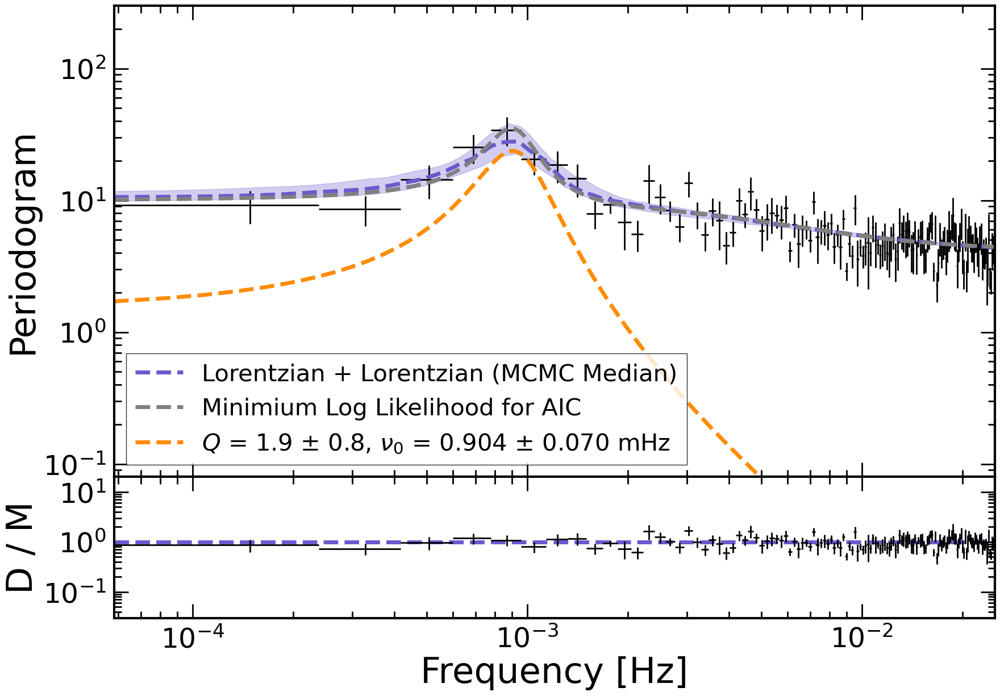

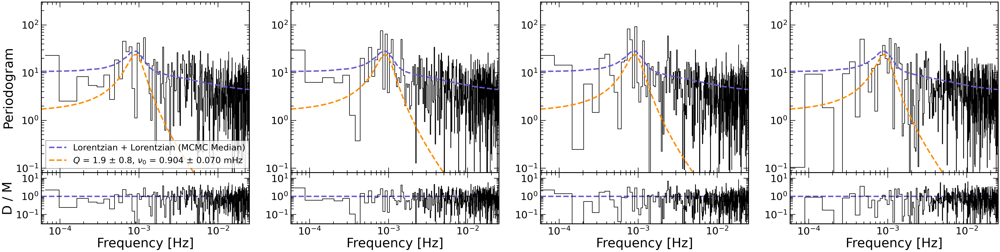

In [55]:
use_obs = np.array(['0902590201', '0902590301', '0902590401', '0902590501'])
name = 'Aug2022'
emin = 2.
emax = 10.
tbin = 20
n = 0

# set up arrays to save data into 
qpo_freq = np.zeros(3)
Q = np.zeros(3)
rms = np.zeros(3)
char_freq = np.zeros(3)

qpo_freq_med, qpo_freq_std, qpo_freq_16, qpo_freq_84, Q_med, Q_err_avg, Q_16, Q_84, rms_med, rms_std, rms_16, rms_84, char_freq_med, char_freq_std, char_freq_16, char_freq_84= \
fit_qpo_multi_lor(name, use_obs, data_path, emin, emax, tbin=tbin, n=12, nsteps=55000, nburn=5000, start_freq=9e-4)

# save qpo frequency
qpo_freq[0] = qpo_freq_med
qpo_freq[1] = qpo_freq_med - qpo_freq_16
qpo_freq[2] = qpo_freq_84 - qpo_freq_med

# save Q
Q[0] = Q_med
Q[1] = Q_med - Q_16
Q[2] = Q_84 - Q_med

# save rms
rms[0] = rms_med
rms[1] = rms_med - rms_16
rms[2] = rms_84 - rms_med

# same characteristic frequency
char_freq[0] = char_freq_med
char_freq[1] = char_freq_med - char_freq_16
char_freq[2] = char_freq_84 - char_freq_med

In [56]:
emin = 2.
emax = 10.
print('ObsID: ', use_obs)
print('------------------')
print('QPO Frequency: {:.3f} - {:.3f} + {:.3f} mHz'.format(qpo_freq[0] / 1e-3, qpo_freq[1] / 1e-3, qpo_freq[2] / 1e-3))
print('QPO Q Factor: {:.1f} - {:.1f} + {:.1f}'.format(Q[0], Q[1], Q[2]))
print('QPO RMS: {:.1f} - {:.1f} + {:.1f} %'.format(rms[0] * 100, rms[1] * 100, rms[2] * 100))
print('Characteristic Frequency: {:.3f} - {:.3f} + {:.3f} mHz'.format(char_freq[0] / 1e-3, char_freq[1] / 1e-3, char_freq[2] / 1e-3))
print('------------------------------------------------------------------')

ObsID:  ['0902590201' '0902590301' '0902590401' '0902590501']
------------------
QPO Frequency: 0.904 - 0.062 + 0.063 mHz
QPO Q Factor: 1.9 - 0.6 + 0.9
QPO RMS: 12.7 - 1.6 + 1.6 %
Characteristic Frequency: 0.942 - 0.064 + 0.075 mHz
------------------------------------------------------------------


In [57]:
def get_AIC_multi_lor(name, obs, emin, emax, tbin, nburn=5000):

    # first grab the data and create lists of frequencies and powers
    # still need the unbinned data for fitting, even if n > 0
    freq = []
    power = []
    f_min = []
    f_max = []
    n = 0
    for i,obsid in enumerate(obs):
        _, _, _, freq_tmp, power_tmp, _, _, f_min_tmp, f_max_tmp, _, _ = make_psd(obsid, data_path, emin, emax, tbin, n=0)
        freq.append(freq_tmp)
        power.append(power_tmp)
        f_min.append(f_min_tmp)
        f_max.append(f_max_tmp)
        n = n + len(freq_tmp)
    
    _, _, _, freq_binned, power_binned, freq_binned_err, power_binned_err, _, _, _, _ = make_psd(obs, data_path, emin, emax, tbin, n=12)
    min_f = freq_binned[0] - freq_binned_err[0]
    max_f = freq_binned[-1] + freq_binned_err[-1] 

    k_lor = 3
    k_qpo_lor = 6

    # load in the data from mcmc fits
    fname = mcmc_path_bb+'broadband_'+name+'_'+str(emin)+'-'+str(emax)+'keV_mcmc_lorentzian.h5'
    backend = emcee.backends.HDFBackend(fname)
    if os.path.exists(fname):
        # samples = backend.get_chain(discard=nburn, flat=True)
        negloglike_lor = min(-backend.get_log_prob(discard=nburn, flat=True))
    fname = mcmc_path_qpo+'qpo_'+name+'_'+str(emin)+'-'+str(emax)+'keV_mcmc_lorentzian.h5'
    backend = emcee.backends.HDFBackend(fname)
    if os.path.exists(fname):
        # samples = backend.get_chain(discard=nburn, flat=True)
        negloglike_qpo_lor = min(-backend.get_log_prob(discard=nburn, flat=True))
    else:
        print('problem')

    AIC_lor = 2 * k_lor + negloglike_lor + ((2 * k_lor * (k_lor + 1)) / (n - k_lor - 1))
    # print(((2 * k_pl * (k_pl + 1)) / (n - k_pl - 1)))
    AIC_qpo_lor = 2 * k_qpo_lor + negloglike_qpo_lor + ((2 * k_qpo_lor * (k_qpo_lor + 1)) / (n - k_qpo_lor - 1))
    # print(((2 * k_qpo_pl * (k_qpo_pl + 1)) / (n - k_qpo_pl - 1)))
    # print(AIC_pl, AIC_qpo_pl)
    delta_AIC = AIC_lor - AIC_qpo_lor
    ep = np.exp(-delta_AIC / 2)

    return delta_AIC, ep

In [58]:
get_AIC_multi_lor(name, use_obs, 2., 10., 20)

(7.616483495116881, 0.02218715530185021)